# AV Behavior with friction implementation in icy weather

In [1]:
import os
import pandas as pd
pd.set_option('display.max_colwidth', None)
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats
from scipy.stats import norm, binom, poisson
from dtaidistance import dtw
import json

## Testing Parameters

In [2]:
weather_param = [[20,0,0,70,0,10,0,10,10],
    [20,0,0,70,0,30,0,10,30],
    [20,0,0,70,0,70,0,10,70],
    [20,0,0,70,0,100,0,10,100]] 


def calc_fric(weather_list):
    return np.exp(-1.89711*weather_list[-1]/100) * (1-weather_list[-1]/100)**3 * 0.85 + 0.15

for i in range(len(weather_param)):
    friction_ratio = calc_fric(weather_param[i])
    weather_param[i] += [friction_ratio]

df = pd.DataFrame(weather_param, columns =["cloudiness","precipitation","precipitation_deposits","sun_altitude_angle","sun_azimuth_angle","wetness","fog_density","wind_intensity", "ice_thickness", "friction_ratio"],
) 
# df.index.name = 'Scenarios'
df

,cloudiness,precipitation,precipitation_deposits,sun_altitude_angle,sun_azimuth_angle,wetness,fog_density,wind_intensity,ice_thickness,friction_ratio
0,20,0,0,70,0,10,0,10,10,0.662573
1,20,0,0,70,0,30,0,10,30,0.315022
2,20,0,0,70,0,70,0,10,70,0.156082
3,20,0,0,70,0,100,0,10,100,0.150000


### With reduced friction

In [3]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [4]:
rel_path = "./Data/Lead Slowdown/Icy Reduced Friction Exponential"
os.path.isdir(rel_path)

True

In [5]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon_fi_lead_slowdown']

In [6]:
subfolders[-1], subfolders[0] = subfolders[0], subfolders[-1]

subfolders

['route_highway_epoch24_clear-noon_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown']

In [7]:
txt_lists_fric = [[] for i in range(5)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [8]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 23.67500035278499,
     'duration_system': 38.7200870513916,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [9]:
avg_complete_fric = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_fric}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-noon_fi_lead_slowdown,1.0
1,route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown,1.0
2,route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown,1.0
3,route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown,0.0
4,route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown,0.0


In [10]:
count = 0

avg_score_fric = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_fric[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_fric}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-noon_fi_lead_slowdown,100.00000
1,route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown,100.00000
2,route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown,100.00000
3,route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown,33.66545
4,route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown,33.66545


#### Setting up into list of DataFrames

In [11]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [12]:
df_array_fric = np.empty((5,100), dtype=object)

for i in range(len(df_array_fric)):
    for j in range((len(df_array_fric[i]))):
        df_array_fric[i][j] = pd.DataFrame()

In [13]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_fric[i][run_index] = df
            run_index += 1

./Data/Lead Slowdown/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon_fi_lead_slowdown
./Data/Lead Slowdown/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown
./Data/Lead Slowdown/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown
./Data/Lead Slowdown/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown
./Data/Lead Slowdown/Icy Reduced Friction Exponential\route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown


In [14]:
df_array_fric[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,340120,0,0.9,-0.000876,0.0,340120,0,502.132203,192.853958,-44.172195,-499.788727,340120,0,192.362411,-86.262680,0.576039,0.000000
1,340121,0,0.9,-0.002197,0.0,340121,0,502.126136,192.853958,-44.172195,-499.823944,340121,0,192.362411,-86.262680,0.534733,0.000000
2,340122,0,0.9,-0.003724,0.0,340122,0,502.120028,192.853958,-44.172195,-499.865234,340122,0,192.362411,-86.262680,0.487313,0.000000
3,340123,0,0.9,-0.000052,0.0,340123,0,502.113942,192.853958,-44.172195,-499.912659,340123,0,192.362411,-86.262680,0.433781,0.000000
4,340124,0,0.9,0.000093,0.0,340124,0,502.107849,192.853958,-44.172195,-499.966187,340124,0,192.362411,-86.262680,0.374139,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356,340476,0,0.0,0.001728,1.0,340476,0,5.137233,192.940323,-36.755962,-0.068421,340476,0,192.912842,-41.892899,-0.020565,4.015343
357,340477,0,0.0,0.001732,1.0,340477,0,5.038831,192.940323,-36.755962,-0.068421,340477,0,192.913498,-41.794495,-0.020544,3.909980
358,340478,0,0.0,0.001677,1.0,340478,0,4.943058,192.940323,-36.755962,-0.068421,340478,0,192.914093,-41.698719,-0.020523,3.804667
359,340479,0,0.0,0.002034,1.0,340479,0,4.849921,192.940323,-36.755962,-0.068421,340479,0,192.914703,-41.605579,-0.020503,3.699395


In [15]:
df_array_fric[0][0]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
936    193.130692
937    193.126053
938    193.121582
939    193.117340
940    193.113388
Name: x, Length: 941, dtype: float64

### Without friction reduction

In [16]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [17]:
rel_path = "./Data/Lead Slowdown/Icy Original/"
os.path.isdir(rel_path)

True

In [18]:
subfolders = os.listdir(path=rel_path)
subfolders

['route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon_fi_lead_slowdown']

In [19]:
subfolders[0], subfolders[-1] = subfolders[-1], subfolders[0]
subfolders

['route_highway_epoch24_clear-noon_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown',
 'route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown']

In [20]:
txt_lists_fric = [[] for i in range(5)]

for i in range(len(txt_lists_fric)):
    for root, dirs, files in os.walk(os.path.join(rel_path, subfolders[i])):
        for file in files:
            if file.endswith(".txt"):
                 with open(os.path.join(root, file), encoding = 'utf-8') as f:
                    read_string = f.read()
                    json_object = json.loads(read_string)
                    txt_lists_fric[i].append(json_object)

In [21]:
txt_lists_fric[2][50]
# txt_lists_fric[0]

{'_checkpoint': {'global_record': {},
  'progress': [0, 1],
  'records': [{'index': 0,
    'infractions': {'collisions_layout': [],
     'collisions_pedestrian': [],
     'collisions_vehicle': [],
     'outside_route_lanes': [],
     'red_light': [],
     'route_dev': [],
     'route_timeout': [],
     'stop_infraction': [],
     'vehicle_blocked': []},
    'meta': {'duration_game': 23.600000351667404,
     'duration_system': 38.6002836227417,
     'route_length': 131.56012567009267},
    'route_id': 'RouteScenario_0',
    'scores': {'score_composed': 100.0,
     'score_penalty': 1.0,
     'score_route': 100.0},
    'status': 'Completed'}]},
 'eligible': False,
 'entry_status': 'Started',
 'labels': [],
 'sensors': ['carla_camera',
  'carla_camera',
  'carla_camera',
  'carla_imu',
  'carla_gnss',
  'carla_speedometer'],
 'values': []}

In [22]:
avg_complete_orig = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        if txt['_checkpoint']['records'][0]['status'] == 'Completed':
            count += 1
    avg_complete_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average complete ratio':avg_complete_orig}) 
# df.index.name = 'Scenarios'

df

,Scenarios,Average complete ratio
0,route_highway_epoch24_clear-noon_fi_lead_slowdown,1.0
1,route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown,1.0
2,route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown,1.0
3,route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown,1.0
4,route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown,1.0


In [23]:
count = 0

avg_score_orig = [_] * 5

for i in range(len(txt_lists_fric)):
    count = 0
    for txt in txt_lists_fric[i]:
        count += txt['_checkpoint']['records'][0]['scores']['score_route'] 
    avg_score_orig[i] = count/100
    
df = pd.DataFrame({'Scenarios':subfolders, 'Average score route':avg_score_orig}) 
df

,Scenarios,Average score route
0,route_highway_epoch24_clear-noon_fi_lead_slowdown,100.0
1,route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown,100.0
2,route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown,100.0
3,route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown,100.0
4,route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown,100.0


#### Setting up into list of DataFrames

In [24]:
os.chdir("C:\\Users\kilob\Senior Research & Thesis\\Simulations")

In [25]:
os.path.isdir("./Data/Ghost Cutin/Rain Original/route_highway_epoch24_clear-sunset_fi_ghost_cutin\\route_highway_epoch24_clear-sunset_fi_ghost_cutin_0\\")

False

In [26]:
df_array_orig = np.empty((5,100), dtype=object)

for i in range(len(df_array_orig)):
    for j in range((len(df_array_orig[i]))):
        df_array_orig[i][j] = pd.DataFrame()

In [27]:
rel_path = "./Data/Lead Slowdown/Icy Original/"

In [28]:
for i in range(len(txt_lists_fric)):
    dir_path = os.path.join(rel_path, subfolders[i])
    print(dir_path)
    
    # list to store files
    res = []

    # Iterate directory
    run_index = 0
    for path in os.listdir(dir_path):
        # check if current path is a file
        if not os.path.isfile(os.path.join(dir_path, path)):
            df = pd.DataFrame()
            for file in os.listdir(os.path.join(dir_path, path)):
                file_path = os.path.join(dir_path, os.path.join(path, file))
    #             print("file_path", file_path)
                if "_ctl.csv" in file_path:
                    df = pd.read_csv(file_path)
                elif "_cvip.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)
                elif "_traj.csv" in file_path:
                    temp = pd.read_csv(file_path)
                    df = pd.concat([df, temp], axis=1)

            df_array_orig[i][run_index] = df
            run_index += 1

./Data/Lead Slowdown/Icy Original/route_highway_epoch24_clear-noon_fi_lead_slowdown
./Data/Lead Slowdown/Icy Original/route_highway_epoch24_clear-noon-icy-10_fi_lead_slowdown
./Data/Lead Slowdown/Icy Original/route_highway_epoch24_clear-noon-icy-30_fi_lead_slowdown
./Data/Lead Slowdown/Icy Original/route_highway_epoch24_clear-noon-icy-70_fi_lead_slowdown
./Data/Lead Slowdown/Icy Original/route_highway_epoch24_clear-noon-icy-100_fi_lead_slowdown


In [29]:
df_array_orig[4][99]

,ts,agent_id,throttle,steer,brake,ts,agent_id,cvip,cvip_x,cvip_y,cvip_z,ts,agent_id,x,y,z,v
0,1694608,0,0.900000,-0.000879,0.0,1694608,0,502.132203,192.853958,-44.172195,-499.788727,1694608,0,192.362411,-86.262680,0.576039,0.000000
1,1694609,0,0.900000,-0.002204,0.0,1694609,0,502.126136,192.853958,-44.172195,-499.823944,1694609,0,192.362411,-86.262680,0.534733,0.000000
2,1694610,0,0.900000,-0.003766,0.0,1694610,0,502.120028,192.853958,-44.172195,-499.865234,1694610,0,192.362411,-86.262680,0.487313,0.000000
3,1694611,0,0.900000,-0.000066,0.0,1694611,0,502.113942,192.853958,-44.172195,-499.912659,1694611,0,192.362411,-86.262680,0.433781,0.000000
4,1694612,0,0.900000,-0.000056,0.0,1694612,0,502.107849,192.853958,-44.172195,-499.966187,1694612,0,192.362411,-86.262680,0.374139,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
954,1695562,0,0.440722,0.000003,0.0,1695562,0,28.931021,192.824722,72.082062,-0.068174,1695562,0,193.245346,43.154137,-0.021166,9.332704
955,1695563,0,0.528812,0.000750,0.0,1695563,0,28.995456,192.819855,72.379875,-0.068174,1695563,0,193.242294,43.387535,-0.021166,9.338232
956,1695564,0,0.542109,0.002309,0.0,1695564,0,29.059801,192.815002,72.677727,-0.068173,1695564,0,193.239410,43.621063,-0.021165,9.342953
957,1695565,0,0.591805,0.001475,0.0,1695565,0,29.124087,192.810150,72.975616,-0.068173,1695565,0,193.236649,43.854691,-0.021163,9.346938


In [30]:
df_array_orig[2][1]['x']

0      192.362411
1      192.362411
2      192.362411
3      192.362411
4      192.362411
          ...    
938    193.169434
939    193.165314
940    193.161362
941    193.157654
942    193.154175
Name: x, Length: 943, dtype: float64

## Comparing completion rate and scores

In [31]:
subfolders = ['clear-noon-icy-0_lead_slowdown',
 'clear-noon-icy-10_lead_slowdown',
 'clear-noon-icy-30_lead_slowdown',
 'clear-noon-icy-70_lead_slowdown',
 'clear-noon-icy-100_lead_slowdown']

In [61]:
print(avg_score_orig)
print(avg_score_fric)
print(avg_complete_orig)
print(avg_complete_fric)

vertical_dict = {'Weather Parameter':subfolders, 'Average Completion Rate Original Friction': [i*100 for i in avg_complete_orig], 'Average Completion Rate Reduced Friction': [i*100 for i in avg_complete_fric], 'Average Score Rate Original Friction': avg_score_orig, 'Average Score Rate Reduced Friction': avg_score_fric} 
    
df = pd.DataFrame(vertical_dict)
    
df 

[100.0, 100.0, 100.0, 100.0, 100.0]
[100.0, 100.0, 100.0, 33.66545013123858, 33.66545013123858]
[1.0, 1.0, 1.0, 1.0, 1.0]
[1.0, 1.0, 1.0, 0.0, 0.0]


,Weather Parameter,Average Completion Rate Original Friction,Average Completion Rate Reduced Friction,Average Score Rate Original Friction,Average Score Rate Reduced Friction
0,clear-noon-icy-0_lead_slowdown,100.0,100.0,100.0,100.00000
1,clear-noon-icy-10_lead_slowdown,100.0,100.0,100.0,100.00000
2,clear-noon-icy-30_lead_slowdown,100.0,100.0,100.0,100.00000
3,clear-noon-icy-70_lead_slowdown,100.0,0.0,100.0,33.66545
4,clear-noon-icy-100_lead_slowdown,100.0,0.0,100.0,33.66545


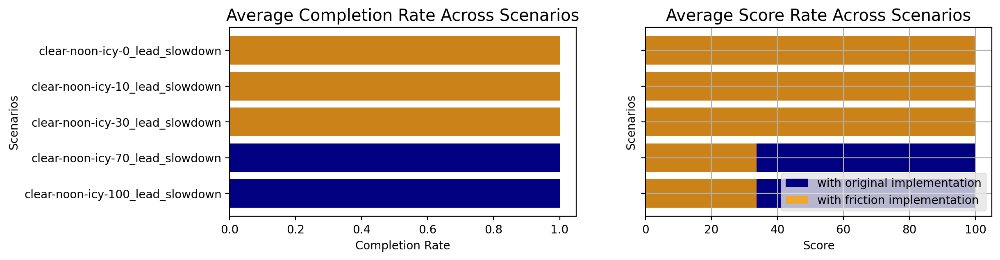

In [33]:
friction_legend = ["with original implementation", "with friction implementation"]

plt.subplots(1, 2, sharey=True, figsize=(12,3), dpi=200)
plt.gca().invert_yaxis()
width = 0.25

plt.subplot(1, 2, 1)
plt.style.use('ggplot')
plt.barh(subfolders, avg_complete_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_complete_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Completion Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Completion Rate')


plt.subplot(1, 2, 2)
plt.style.use('ggplot')
plt.barh(subfolders, avg_score_orig, label=friction_legend[0], color="navy")
plt.barh(subfolders, avg_score_fric, label=friction_legend[1], color="orange" , alpha = 0.8)
plt.title('Average Score Rate Across Scenarios')
plt.ylabel('Scenarios')
plt.xlabel('Score')

plt.grid()

plt.legend()
plt.show()

## Comparison

In [34]:
attribute_order = ["x", "y", "v", "cvip", "steer", "brake", "throttle"]

all_medians = np.empty((len(txt_lists_fric), len(attribute_order), 2), dtype=object)
# [[[], []] * len(attribute_order)  for i in range(len(txt_lists_fric))]

all_medians

array([[[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]],

       [[None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None],
        [None, None]]], dtype=object)

In [35]:
full_legend = subfolders.copy()

### x,y traces

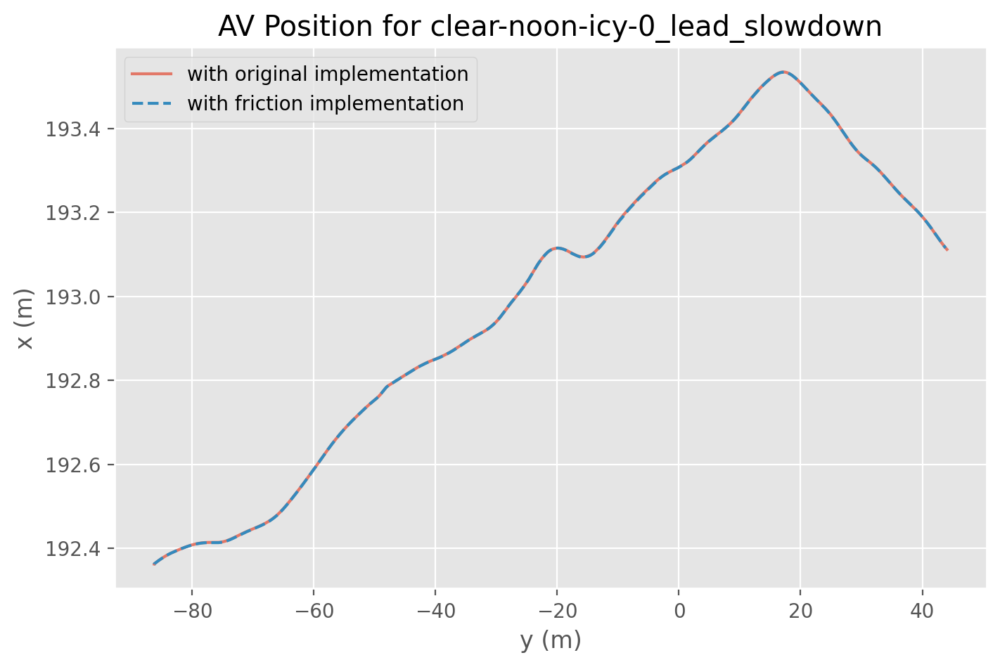

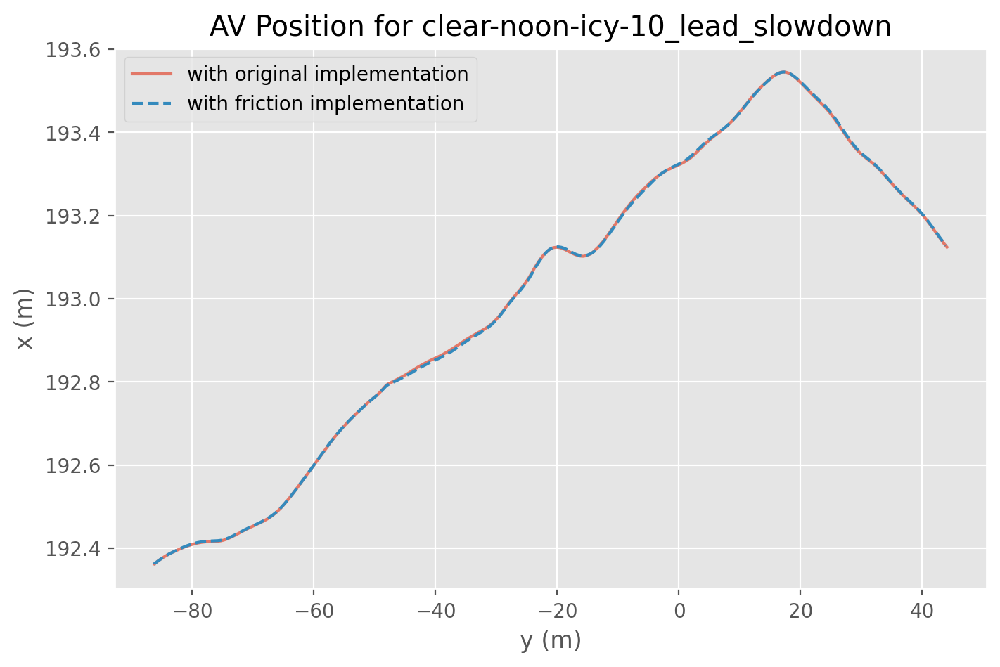

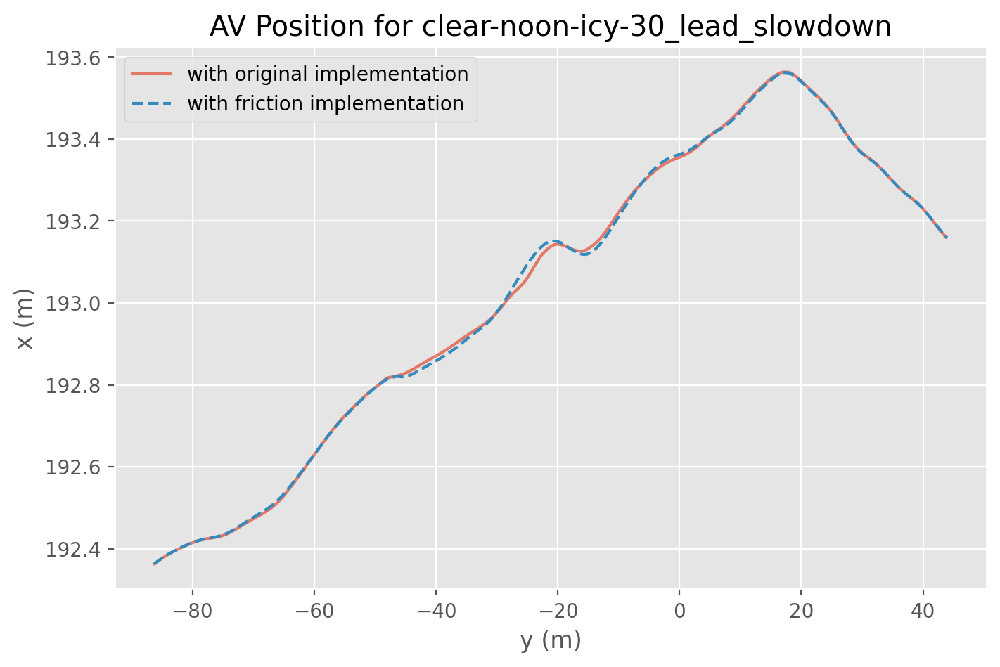

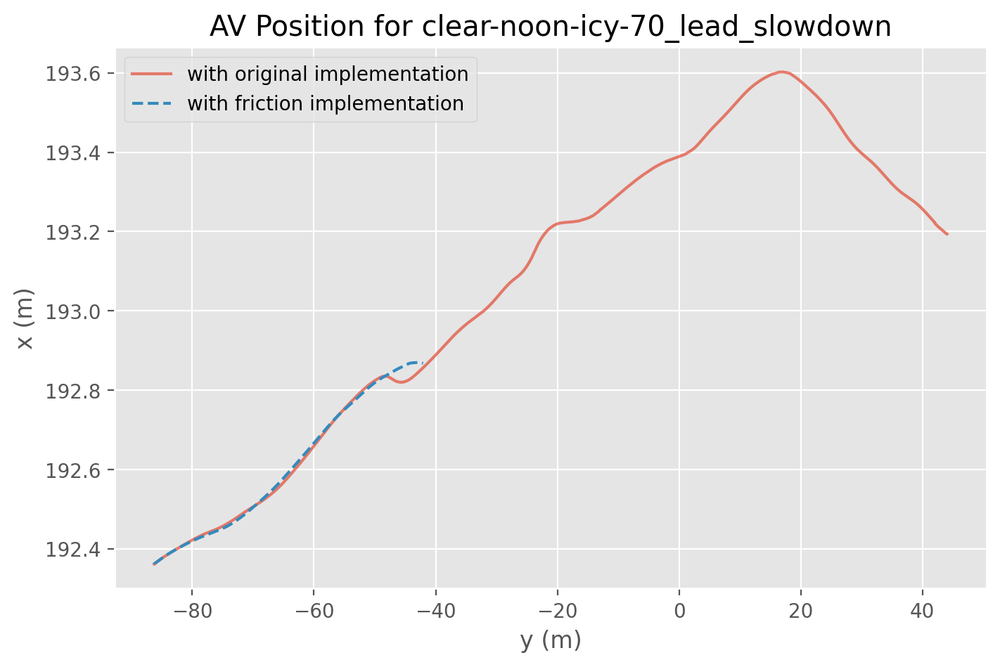

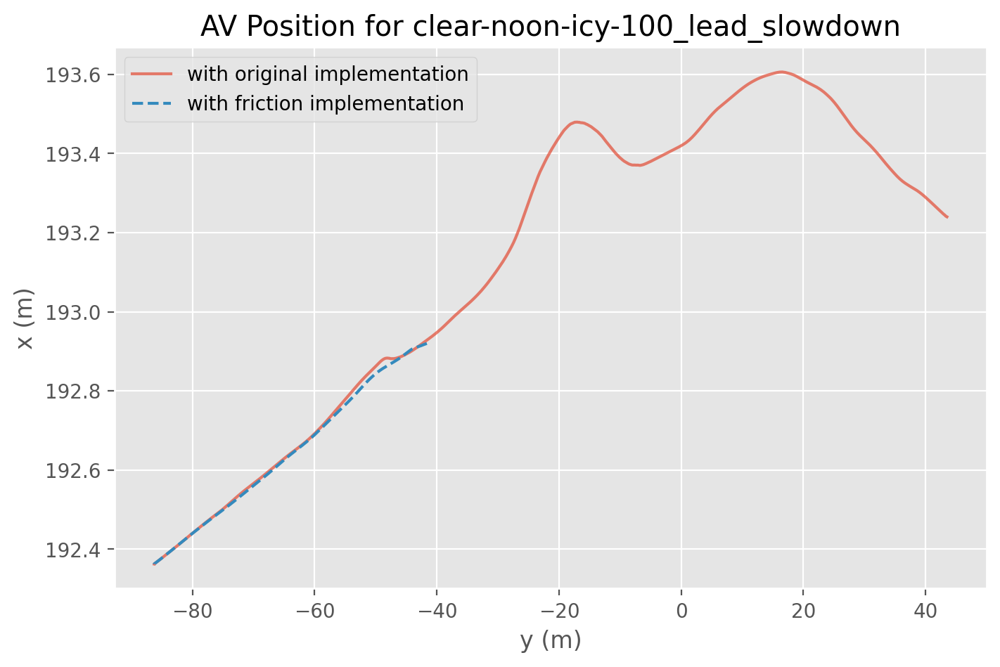

In [36]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)


    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    
    all_medians[weather][0][0] = median_orig_x
    all_medians[weather][0][1] = median_fric_x
    all_medians[weather][1][0] = median_orig_y
    all_medians[weather][1][1] = median_fric_y
    
    plt.plot(median_fric_y, median_fric_x, '--')
    plt.xlabel("y (m)")
    plt.ylabel("x (m)")
    
    plt.title("AV Position for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

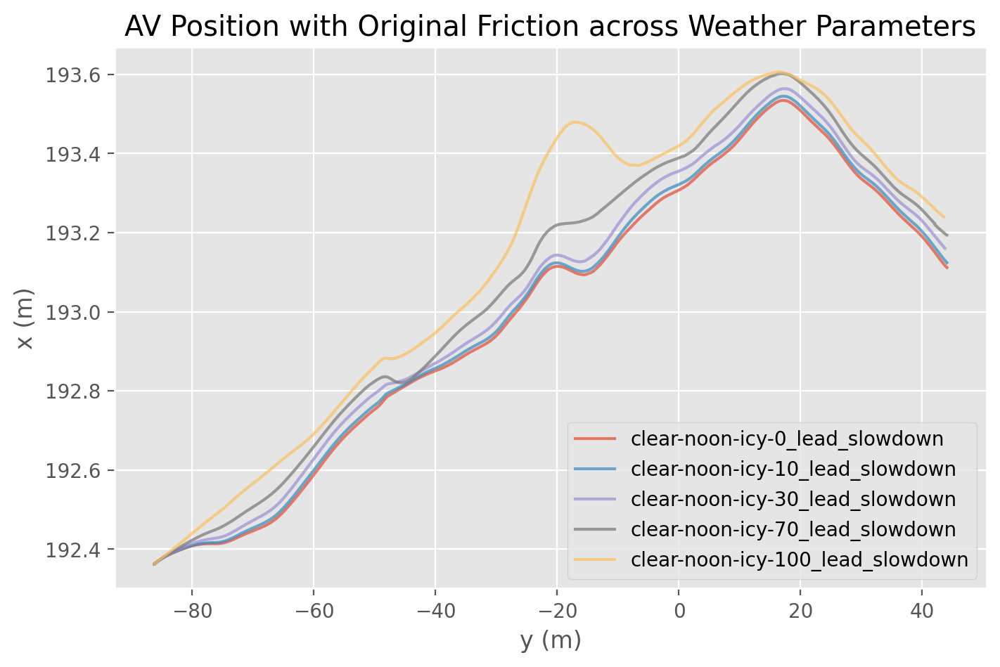

In [37]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    df_orig_x = pd.DataFrame()
    df_orig_y = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['x'].dtypes == 'object' or df_array_orig[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['x'].isnull().values.any() and not df_array_orig[weather][i]['y'].isnull().values.any():
                df_orig_x["Run"+str(i)] = df_array_orig[weather][i]['x']
                df_orig_y["Run"+str(i)] = df_array_orig[weather][i]['y']

    median_orig_x = df_orig_x.median(axis=1)
    median_orig_y = df_orig_y.median(axis=1)

    plt.plot(median_orig_y, median_orig_x, alpha=0.7)

    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

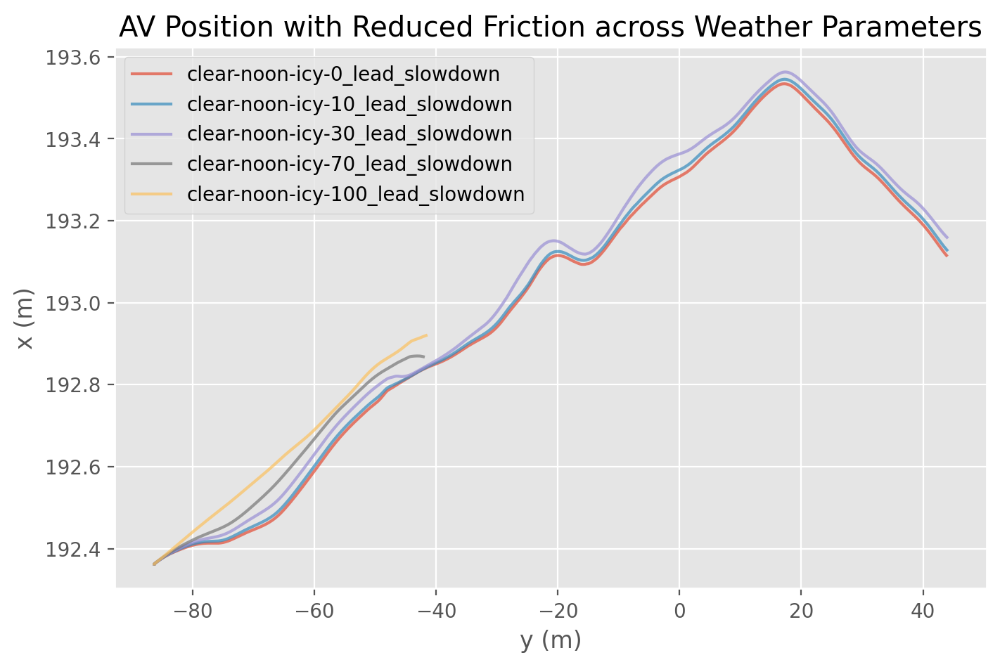

In [38]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_x = pd.DataFrame()
    df_fric_y = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['x'].dtypes == 'object' or df_array_fric[weather][i]['y'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['x'].isnull().values.any() and not df_array_fric[weather][i]['y'].isnull().values.any():
                df_fric_x["Run"+str(i)] = df_array_fric[weather][i]['x']
                df_fric_y["Run"+str(i)] = df_array_fric[weather][i]['y']

    median_fric_x = df_fric_x.median(axis=1)
    median_fric_y = df_fric_y.median(axis=1)

    plt.plot(median_fric_y, median_fric_x, alpha=0.7)
    
# plt.axis('equal')
plt.xlabel("y (m)")
plt.ylabel("x (m)")
plt.title("AV Position with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### v

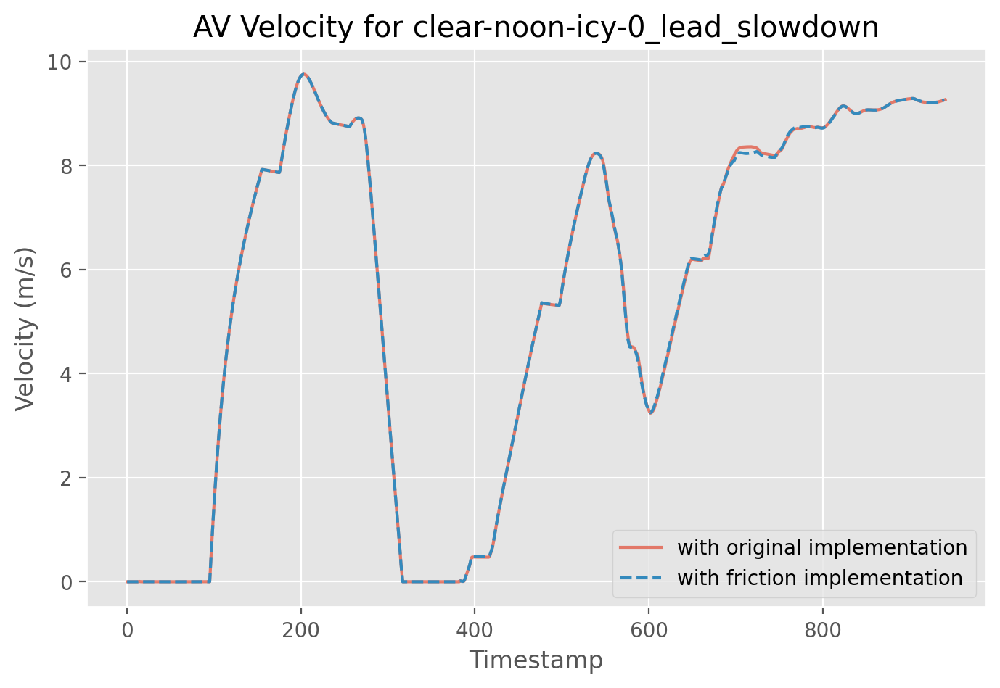

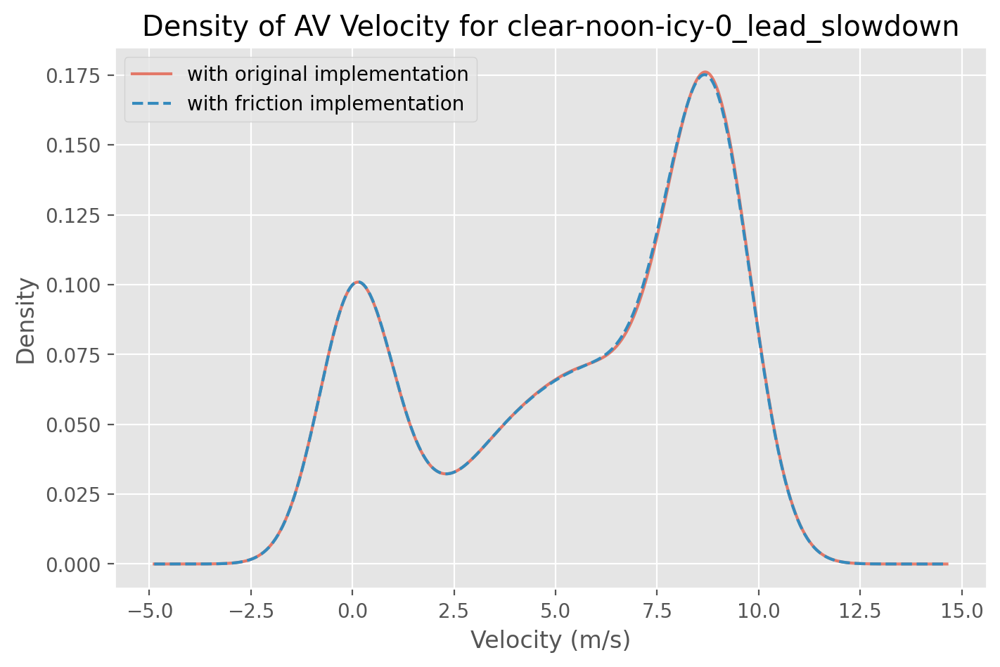

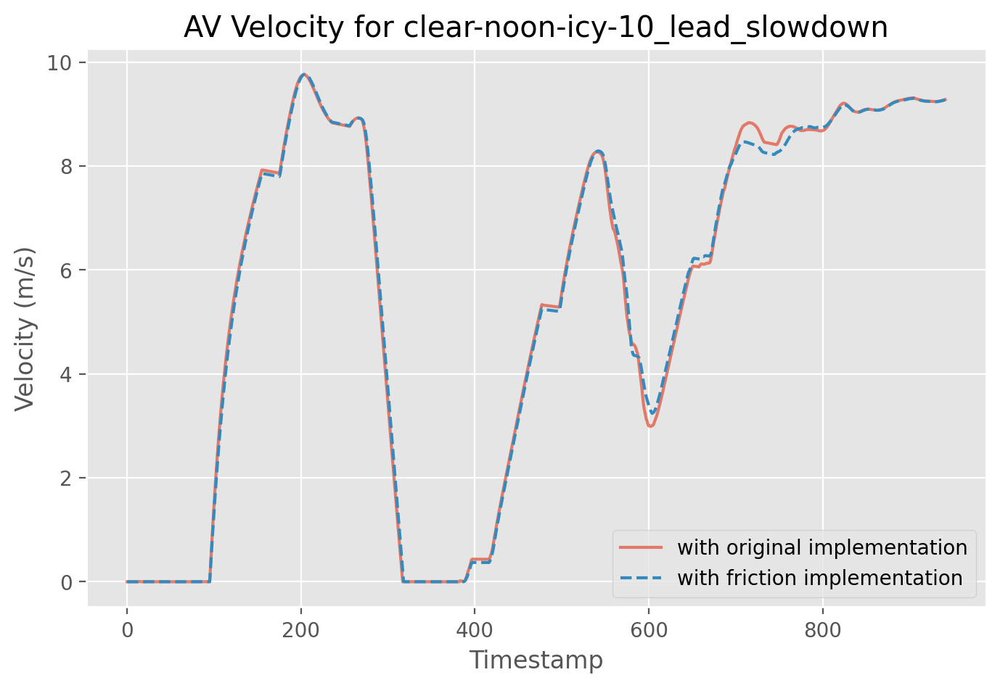

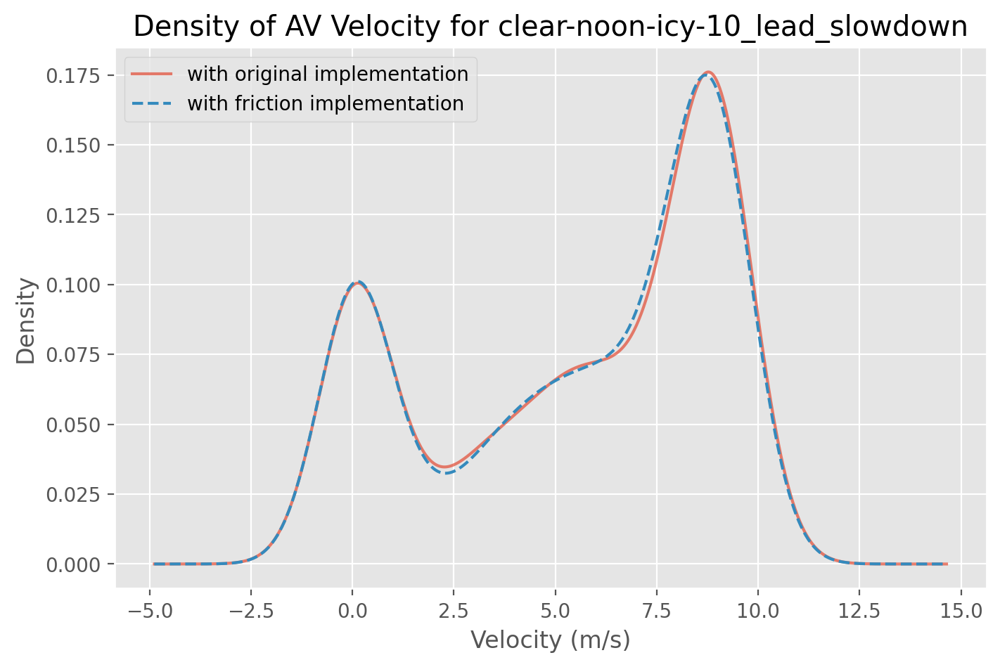

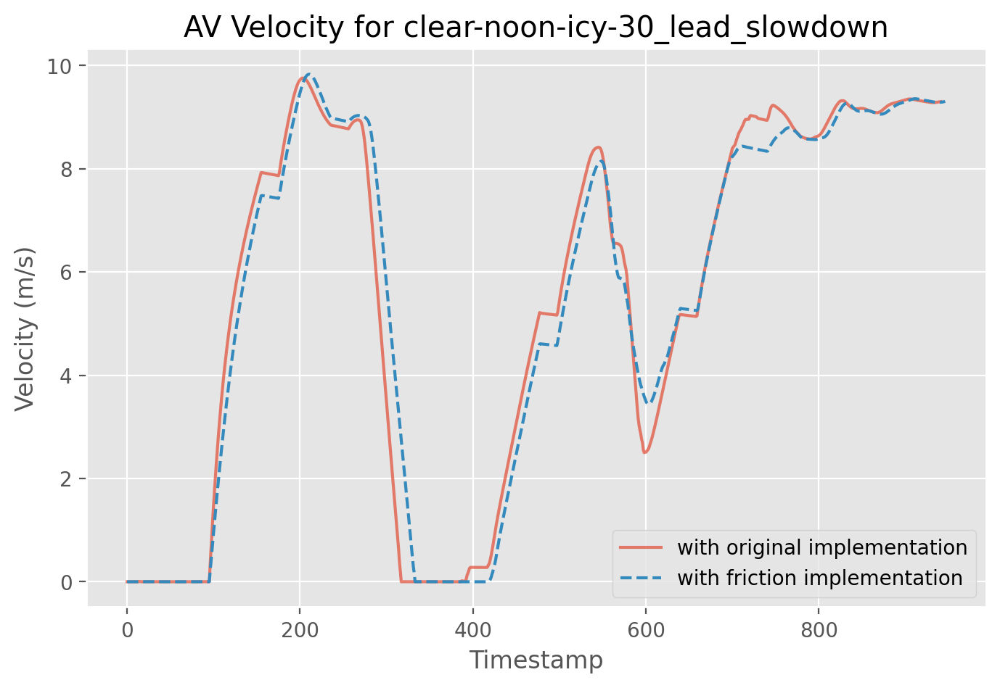

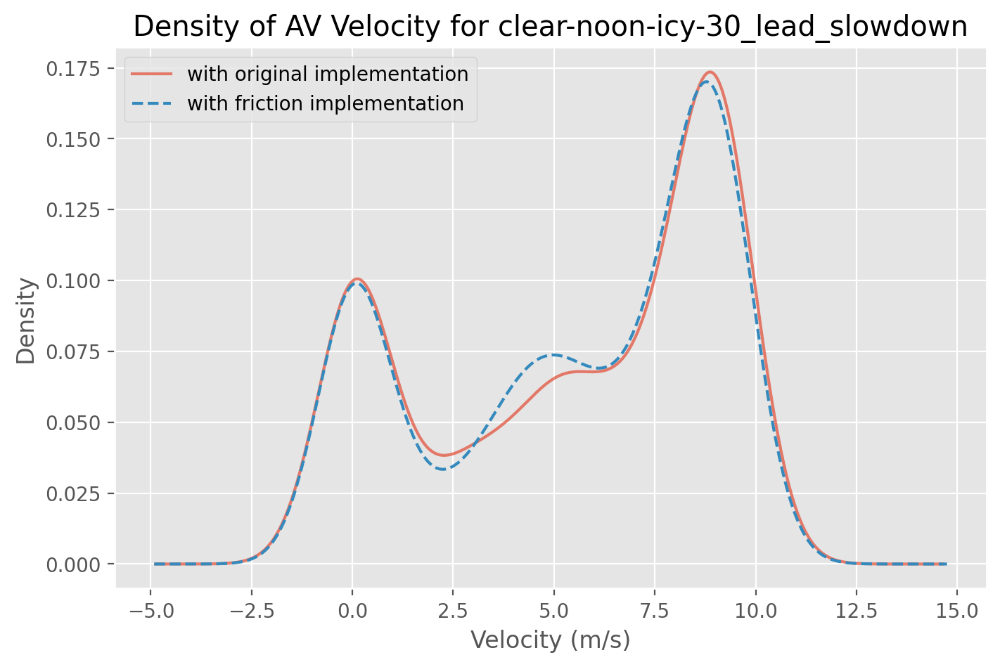

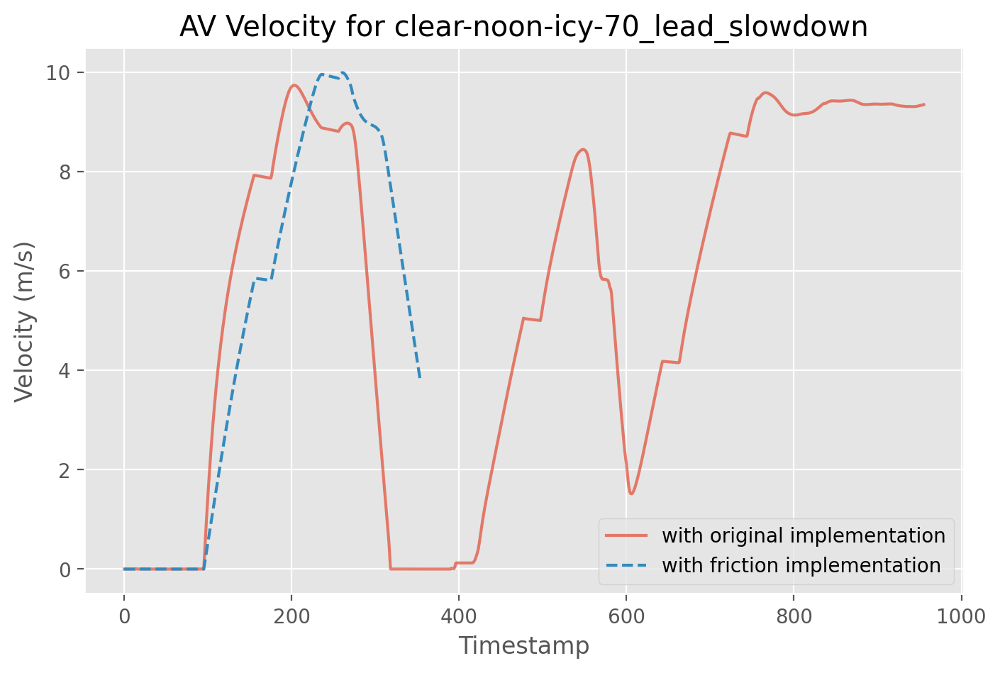

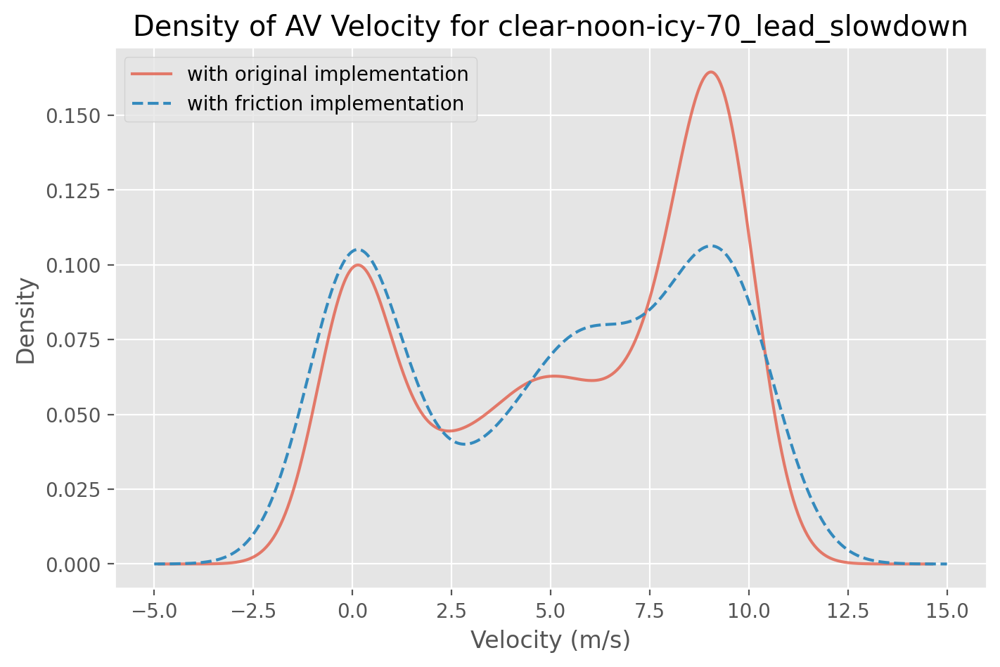

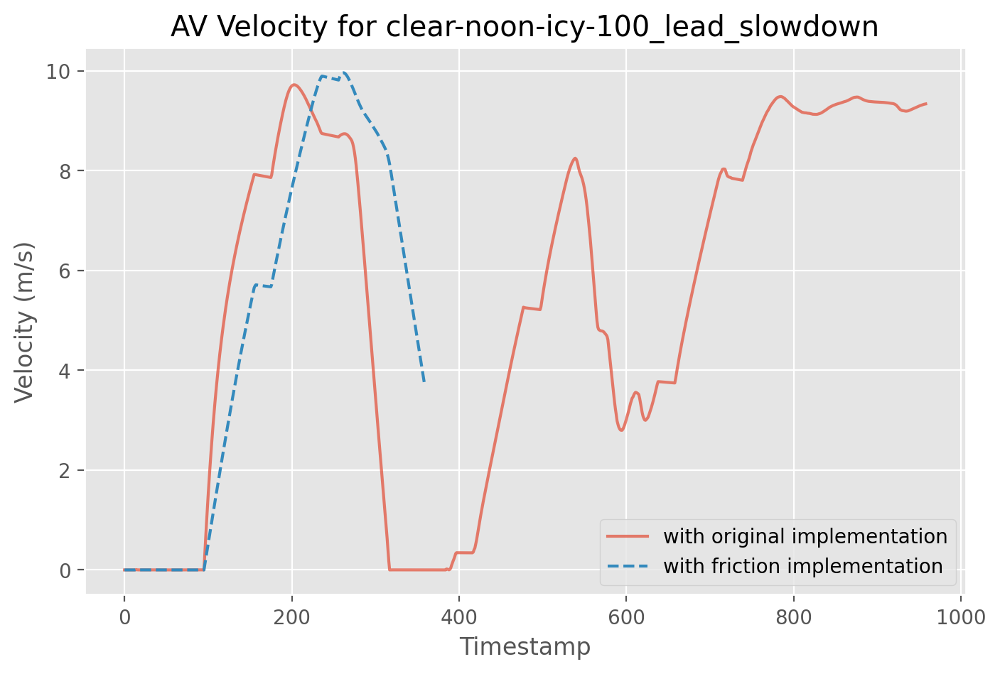

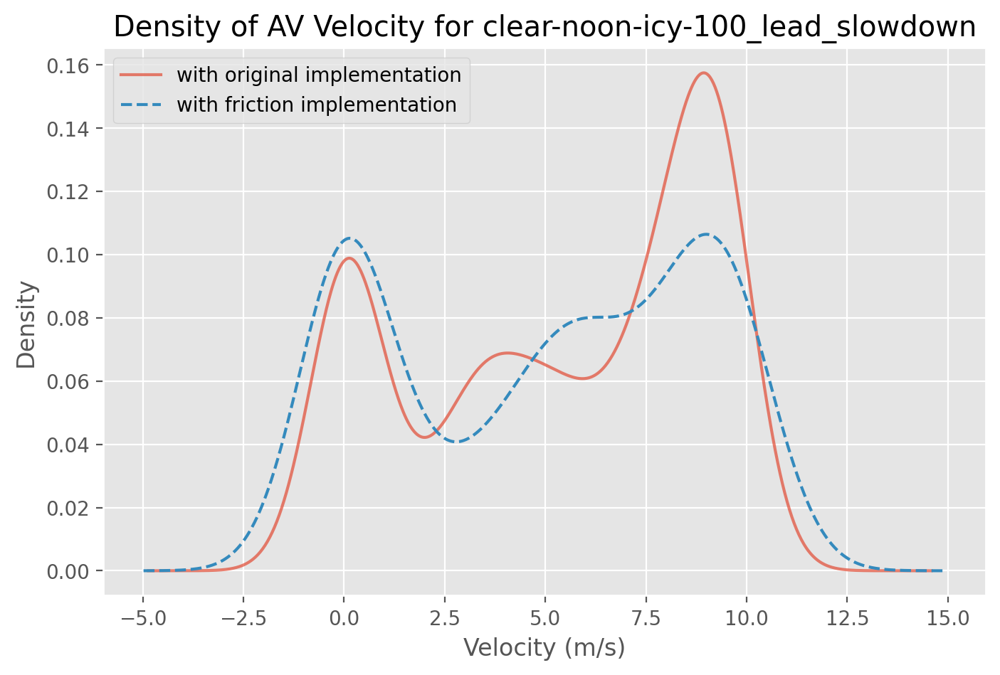

In [39]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)

    plt.plot(median_orig_v, alpha=0.7)


    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any():
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)
    
    all_medians[weather][2][0] = median_orig_v
    all_medians[weather][2][1] = median_fric_v
    
    plt.plot(median_fric_v, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Velocity (m/s)")
    plt.title("AV Velocity for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Velocity (m/s)")
    plt.ylabel("Density")
    median_orig_v.plot.density(alpha=0.7)
    median_fric_v.plot.density(style='--')
    plt.title("Density of AV Velocity for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

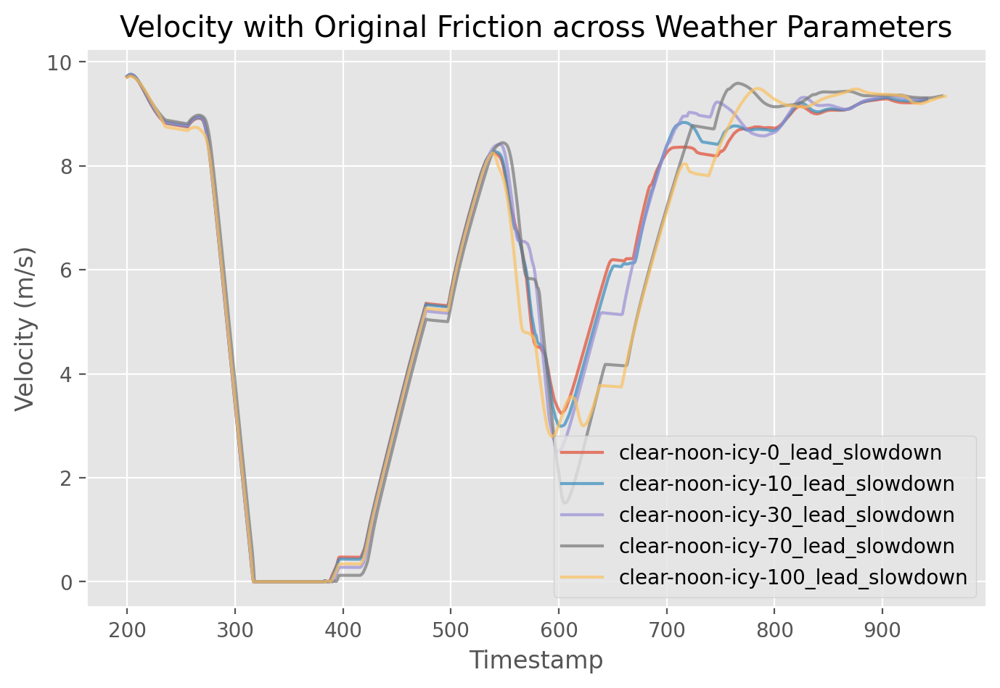

In [40]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_v = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['v'].dtypes == 'v'):
            print(i)
        else:
            if not df_array_orig[weather][i]['v'].isnull().values.any():
                df_orig_v["Run"+str(i)] = df_array_orig[weather][i]['v']

    median_orig_v = df_orig_v.median(axis=1)


    plt.plot(median_orig_v[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

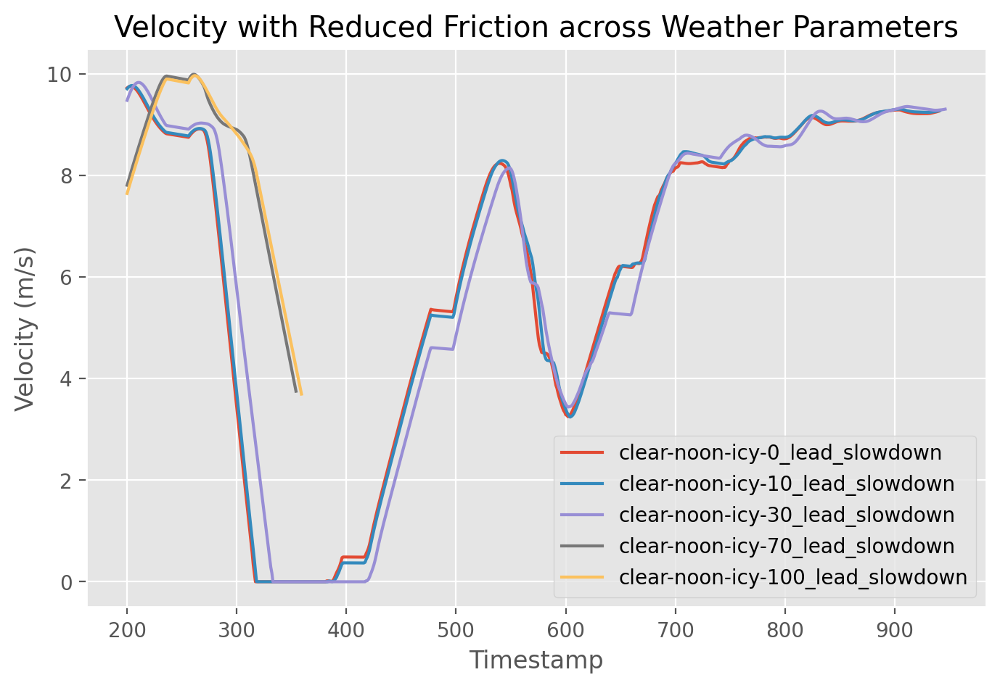

In [41]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_v = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['v'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['v'].isnull().values.any() :
                df_fric_v["Run"+str(i)] = df_array_fric[weather][i]['v']

    median_fric_v = df_fric_v.median(axis=1)

    plt.plot(median_fric_v[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Velocity (m/s)")
plt.title("Velocity with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### cvip

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
936     23.820178
937     23.885765
938     23.951298
939     24.016767
940     24.082152
Length: 941, dtype: float64


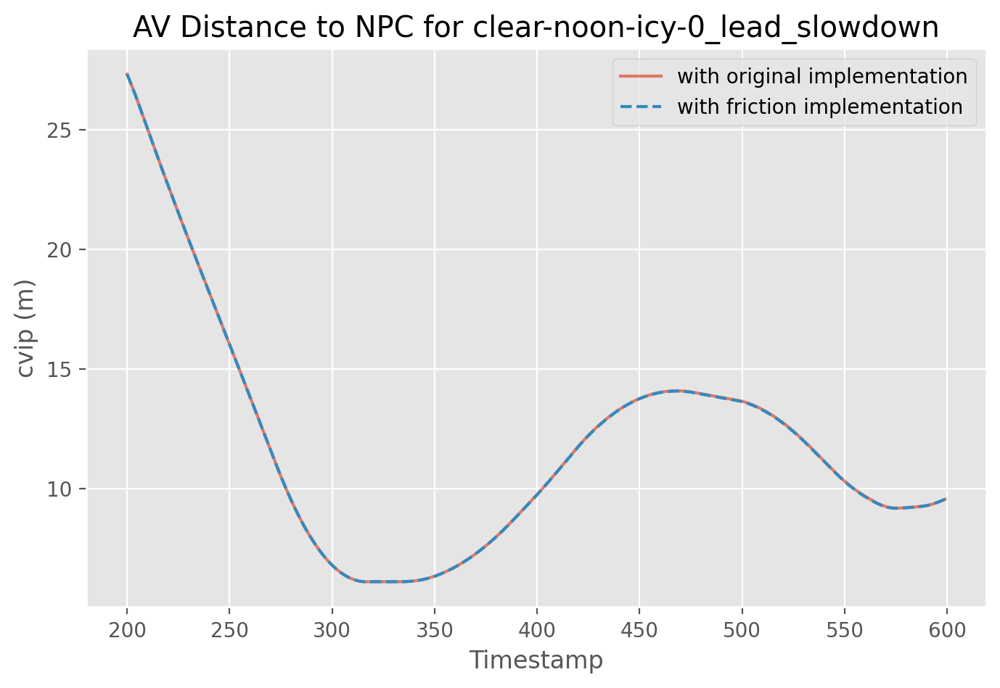

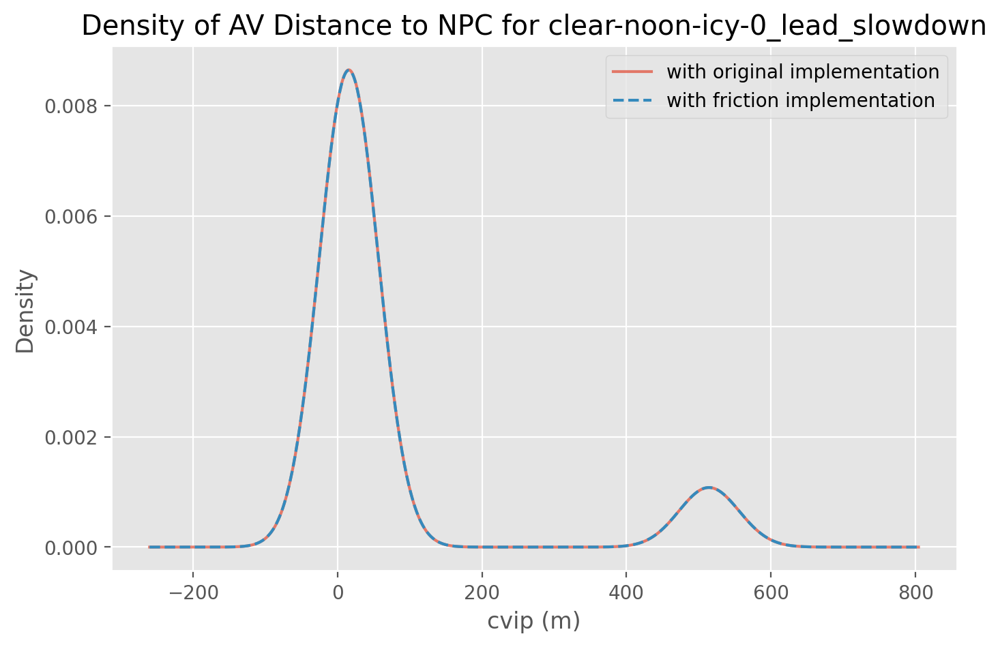

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
937     23.716308
938     23.781497
939     23.846657
940     23.911726
941     23.976684
Length: 942, dtype: float64


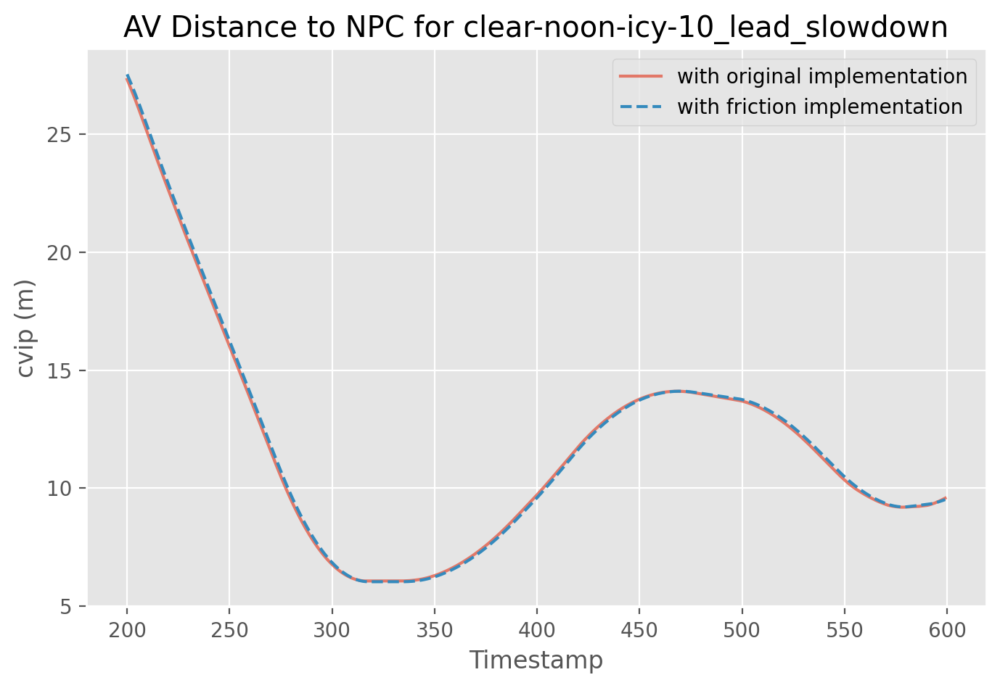

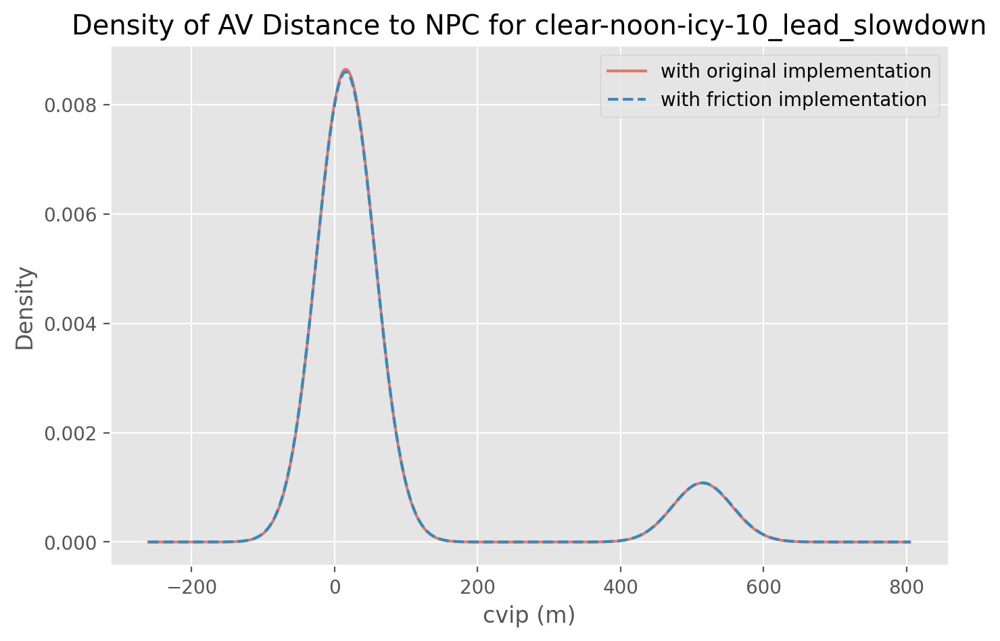

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
942     23.360538
943     23.424575
944     23.488647
945     23.552823
946     23.616942
Length: 947, dtype: float64


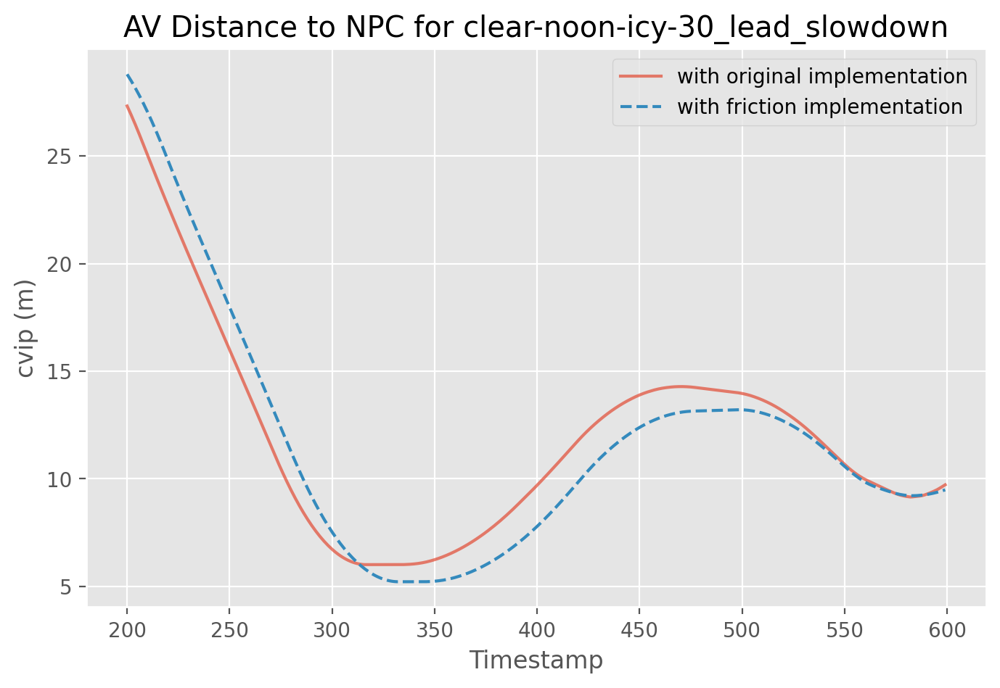

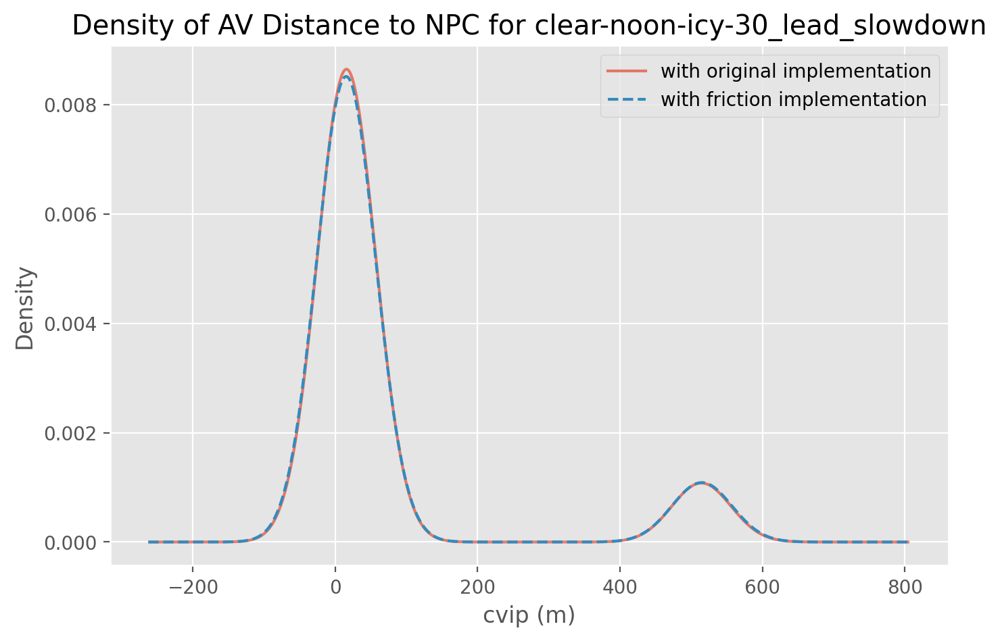

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
350      5.130400
351      5.027763
352      4.927868
353      4.830935
354      4.738717
Length: 355, dtype: float64


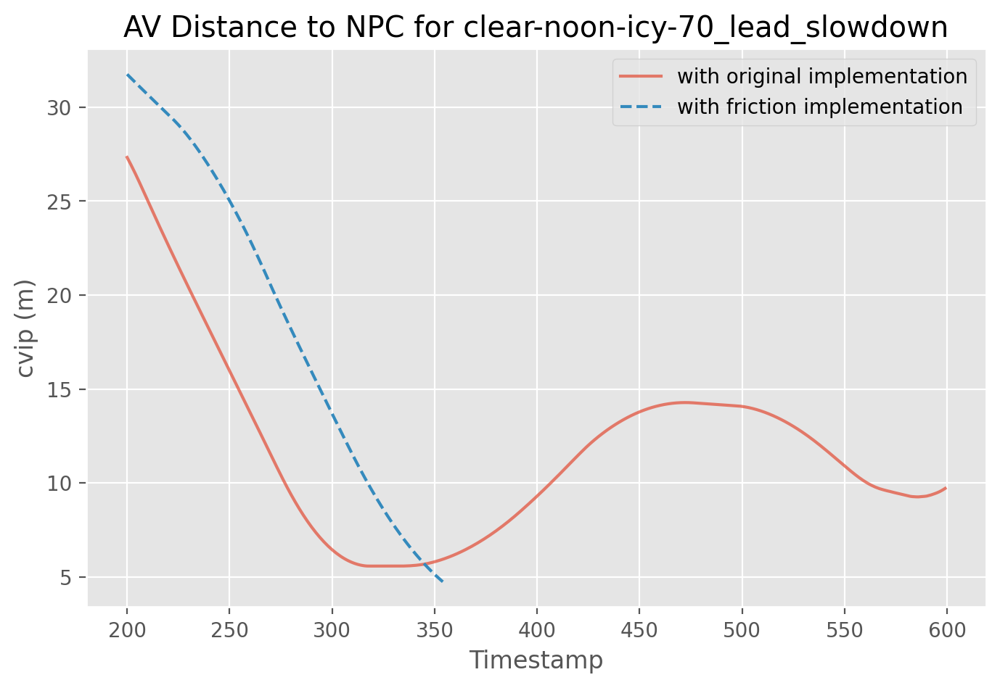

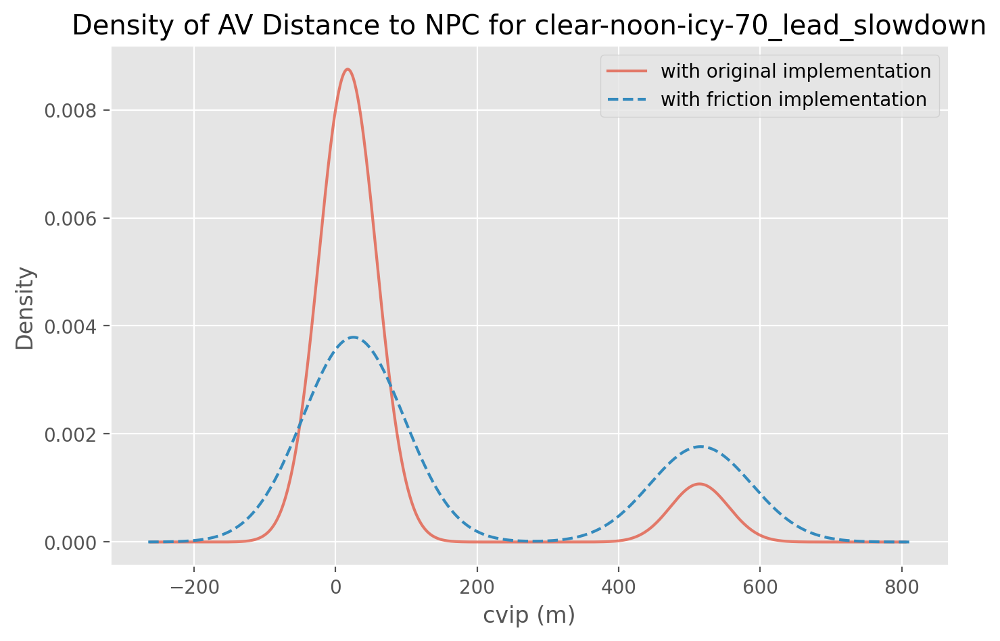

0      502.132203
1      502.126136
2      502.120028
3      502.113942
4      502.107849
          ...    
355      5.254481
356      5.153449
357      5.055050
358      4.959287
359      4.868299
Length: 360, dtype: float64


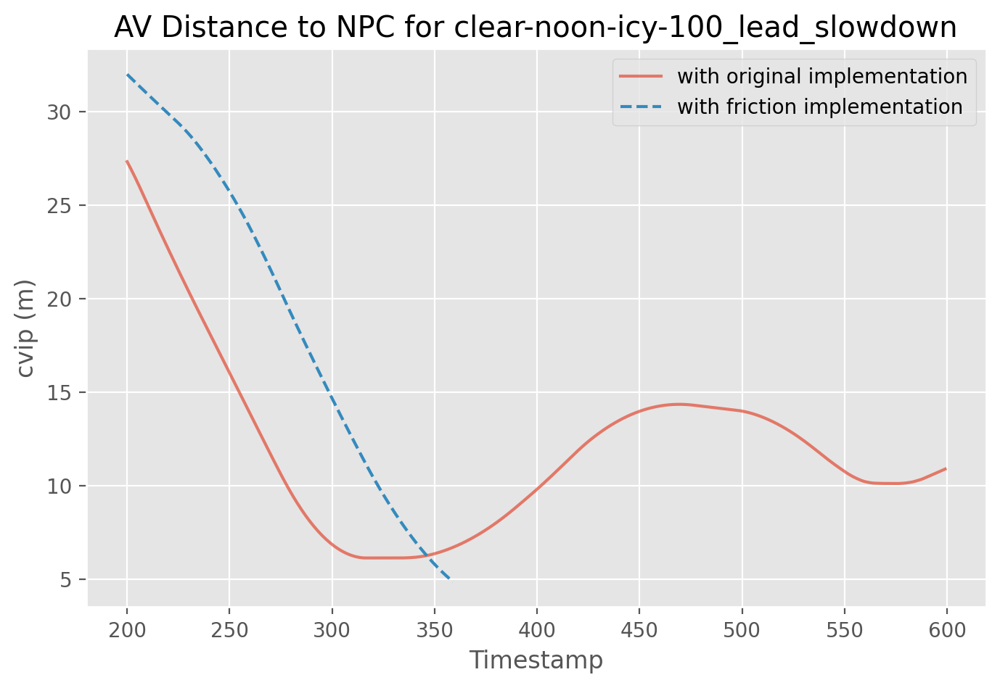

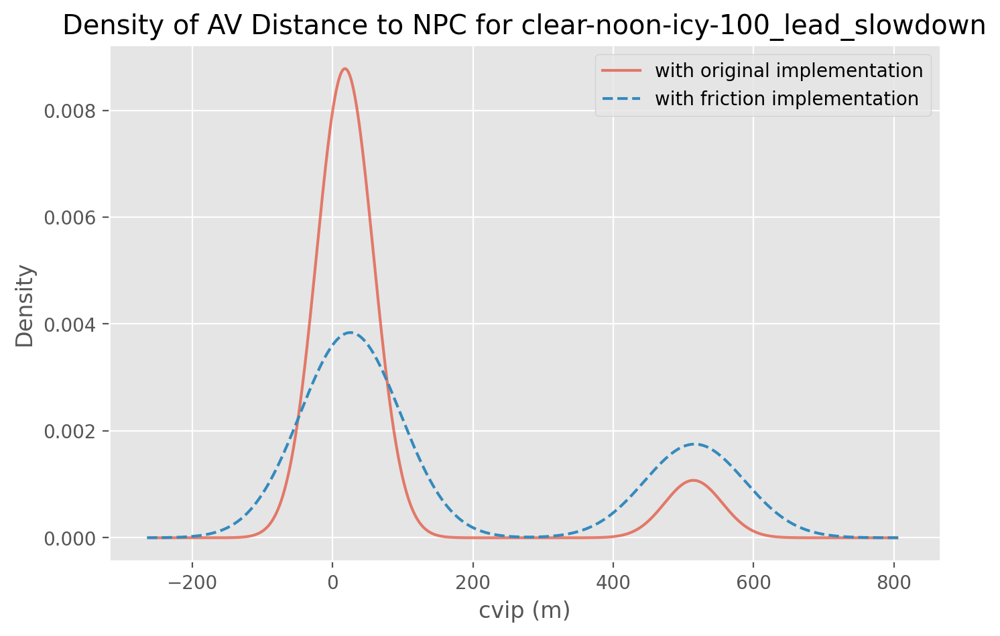

In [42]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)

    plt.plot(median_orig_cvip.iloc[200:600], alpha=0.7)


    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any():
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)
    
    print(median_fric_cvip)
    
    all_medians[weather][3][0] = median_orig_cvip
    all_medians[weather][3][1] = median_fric_cvip
    
    plt.plot(median_fric_cvip.iloc[200:600], '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("cvip (m)")
    plt.title("AV Distance to NPC for " + subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("cvip (m)")
    plt.ylabel("Density")
    median_orig_cvip.plot.density(alpha=0.7)
    median_fric_cvip.plot.density(style='--')
    plt.title("Density of AV Distance to NPC for " + subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

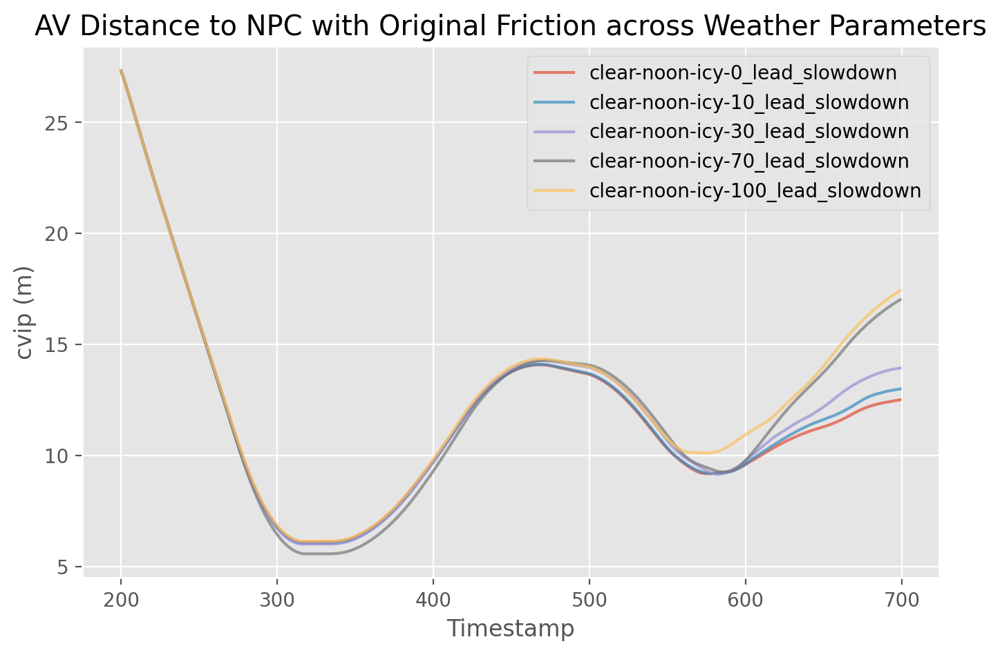

In [43]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_cvip = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['cvip'].isnull().values.any():
                df_orig_cvip["Run"+str(i)] = df_array_orig[weather][i]['cvip']

    median_orig_cvip = df_orig_cvip.median(axis=1)


    plt.plot(median_orig_cvip[200:700], alpha=0.7)



    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

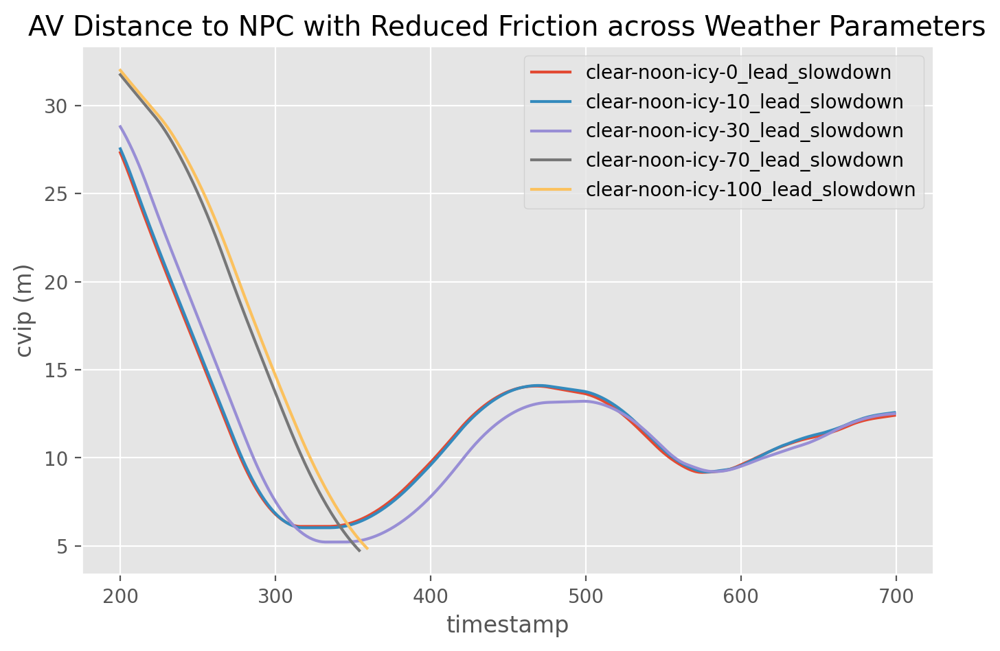

In [44]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_cvip = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['cvip'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['cvip'].isnull().values.any() :
                df_fric_cvip["Run"+str(i)] = df_array_fric[weather][i]['cvip']

    median_fric_cvip = df_fric_cvip.median(axis=1)

    plt.plot(median_fric_cvip[200:700])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("cvip (m)")
plt.title("AV Distance to NPC with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### steer

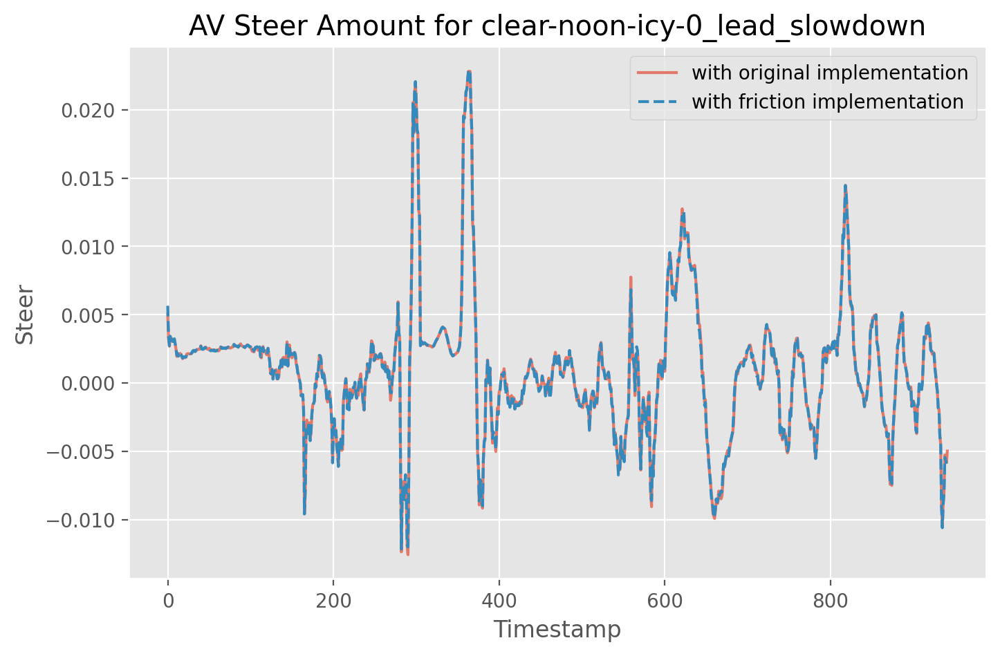

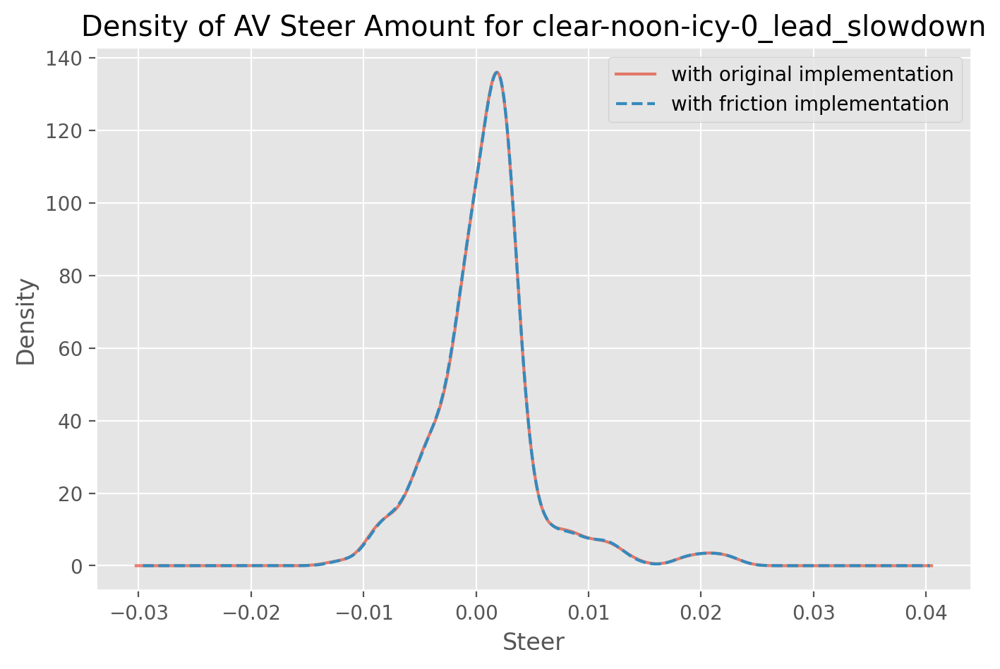

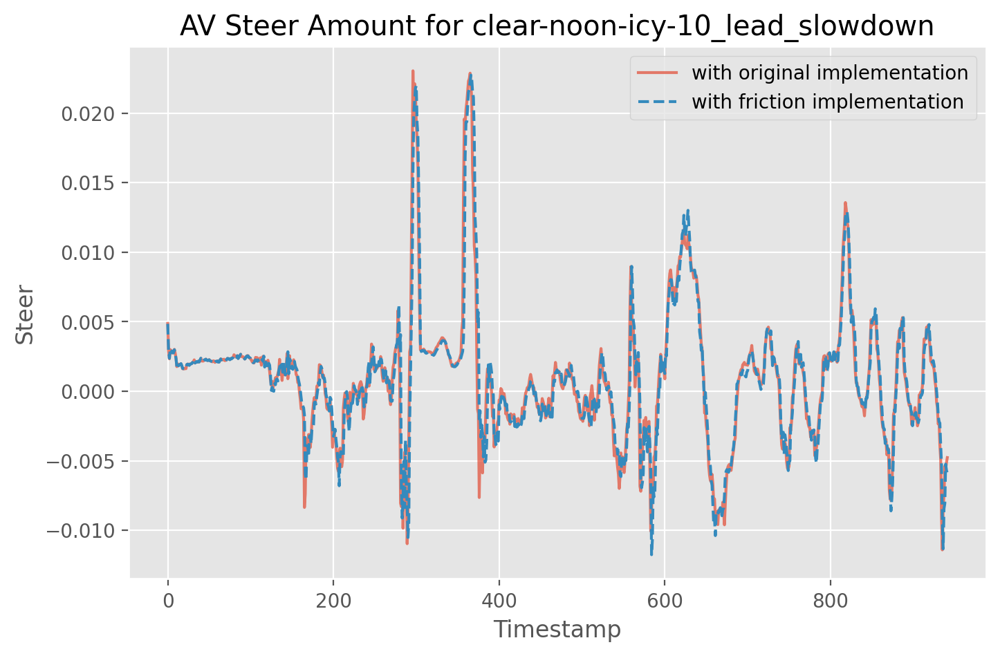

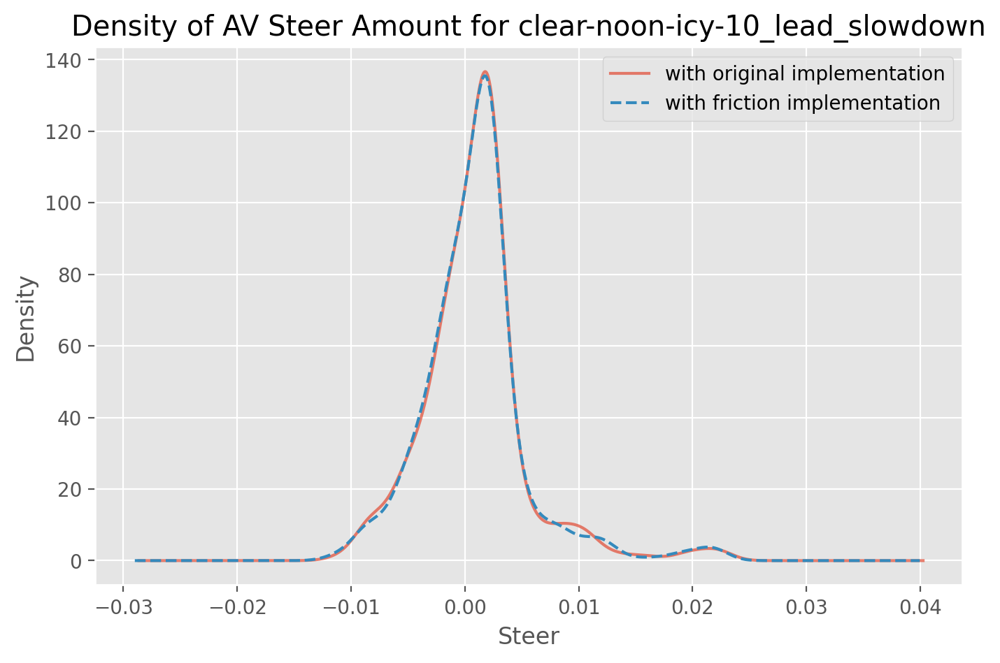

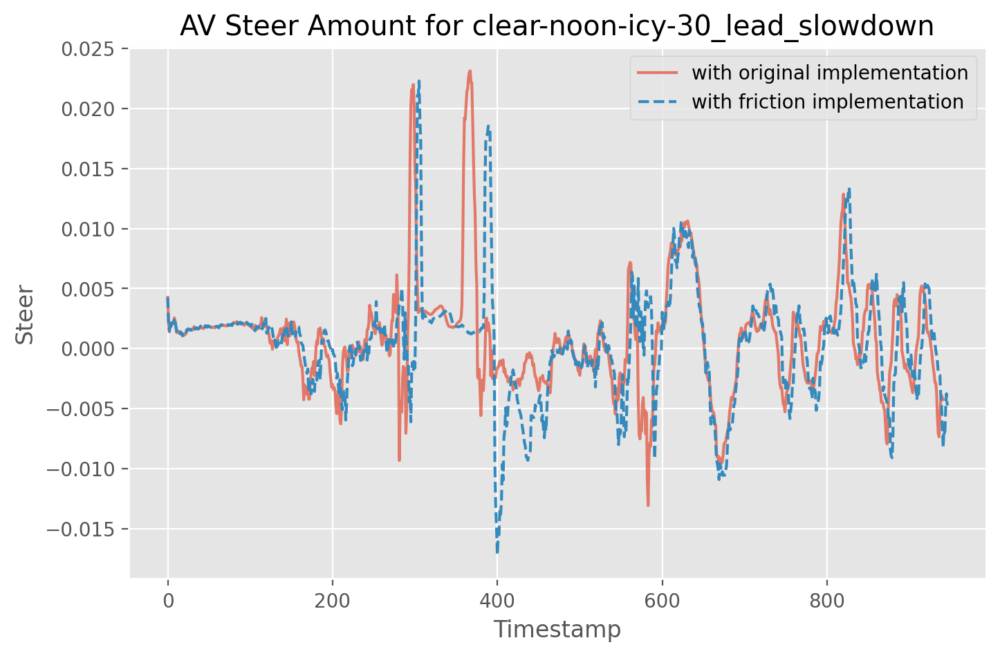

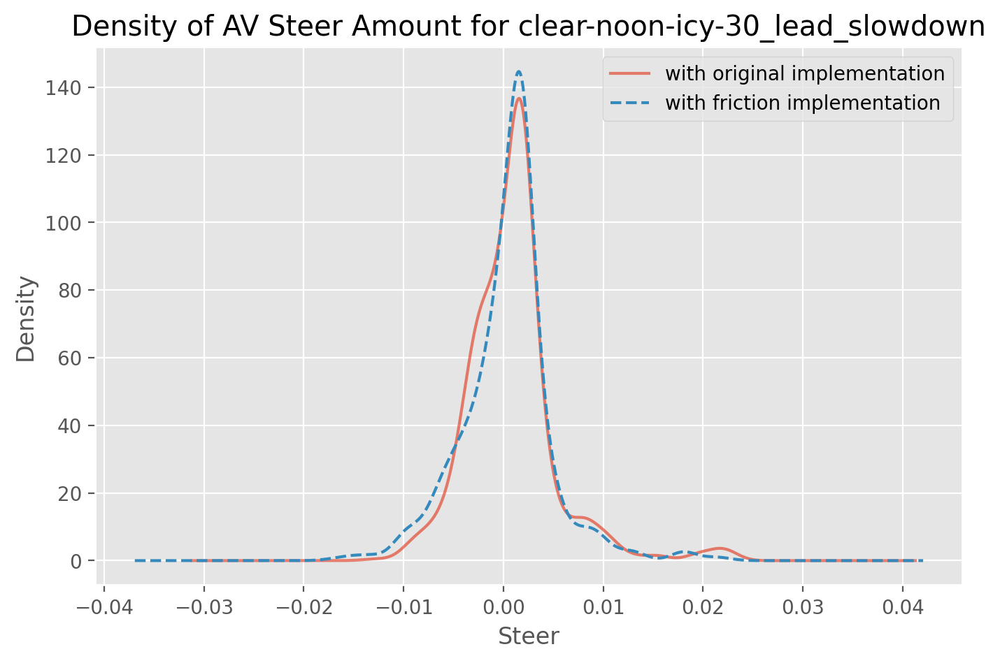

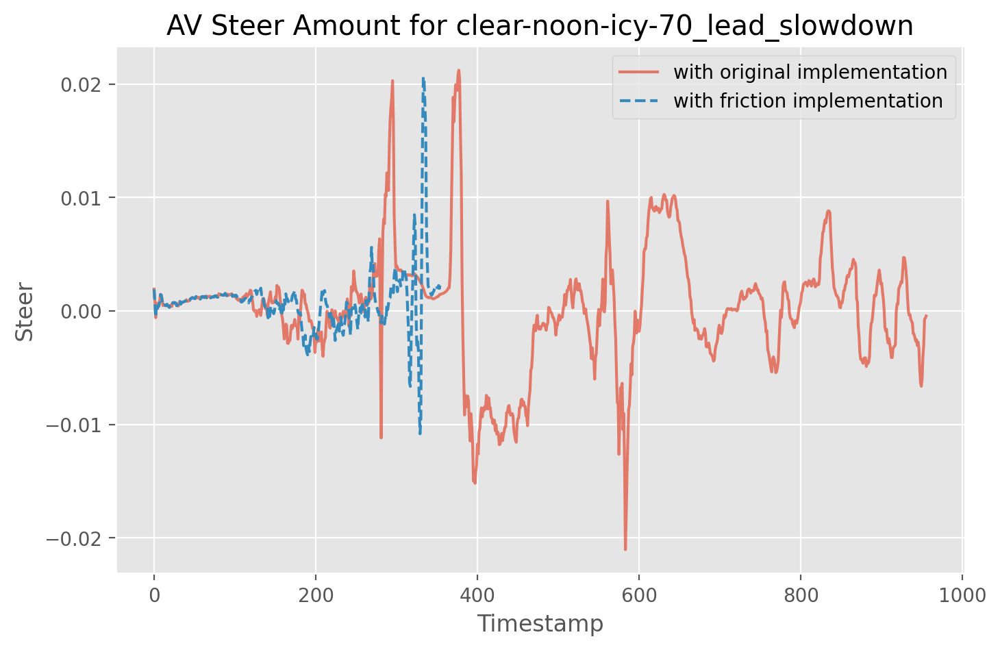

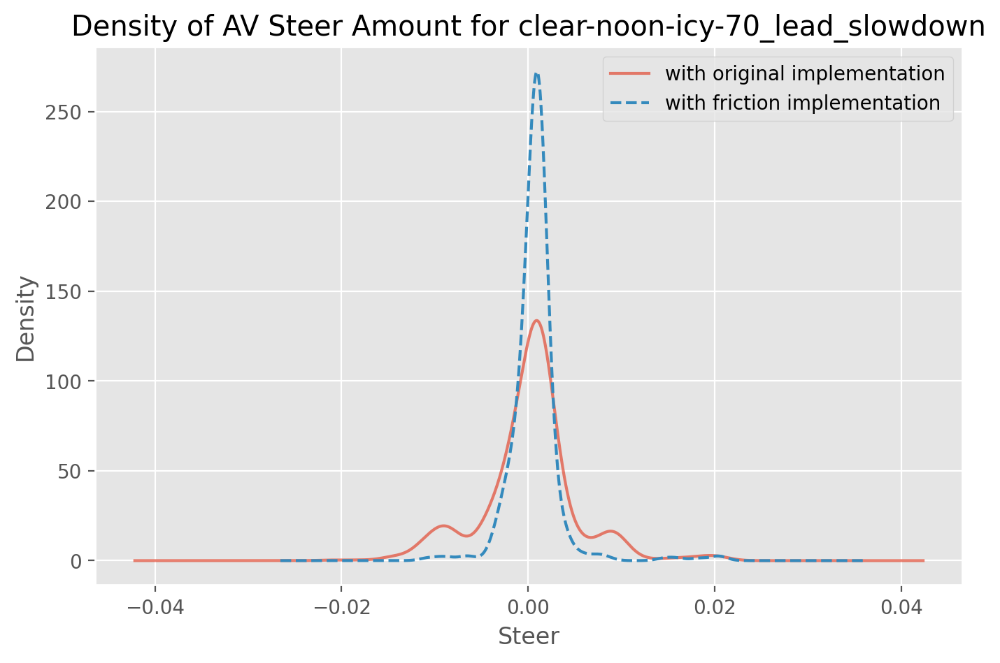

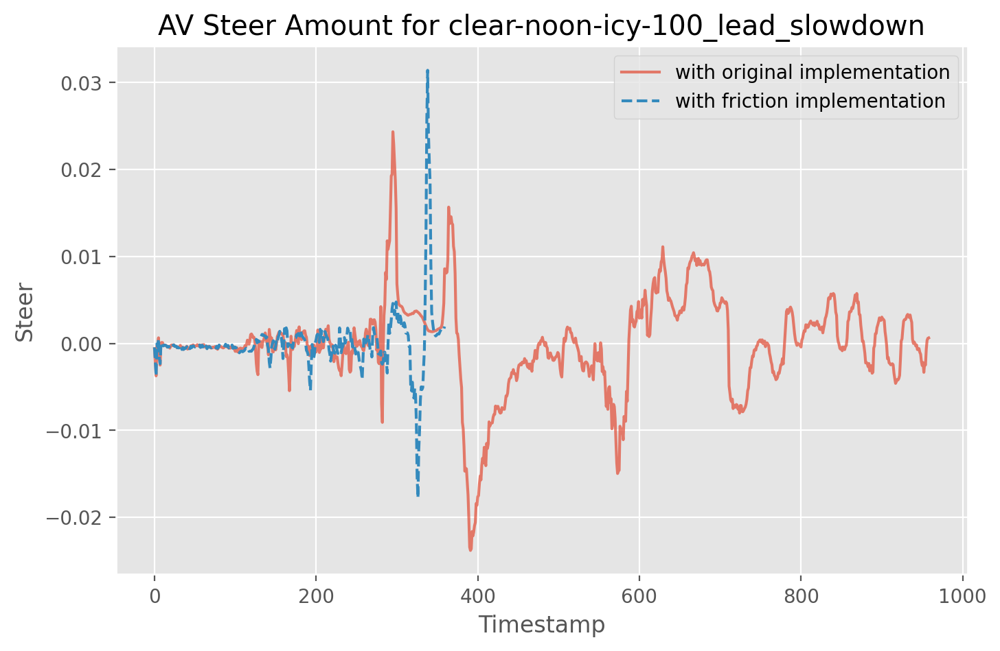

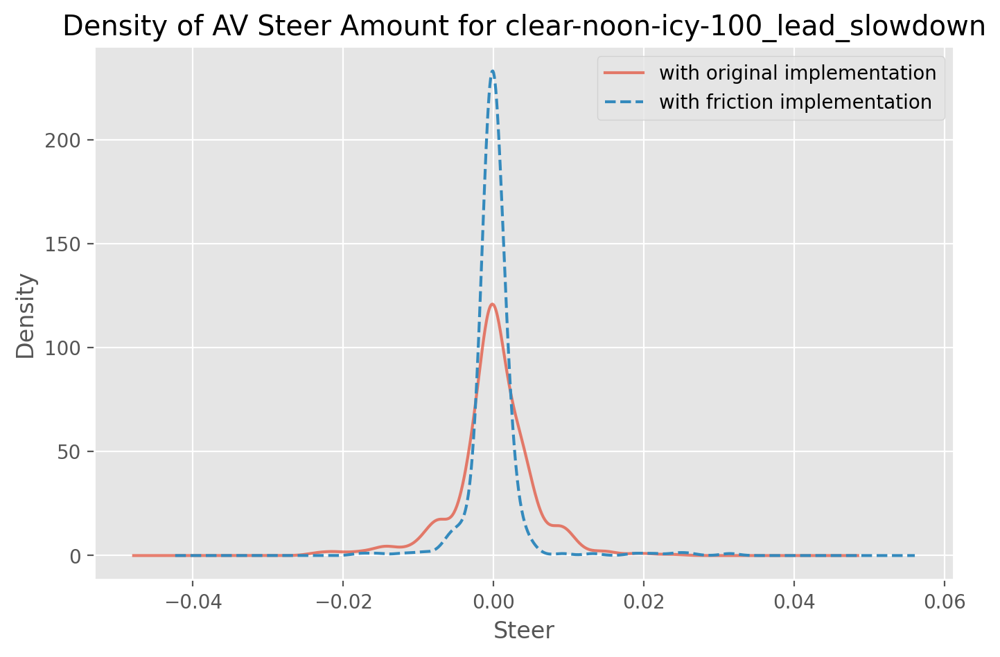

In [45]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)

    plt.plot(median_orig_steer, alpha=0.7)


    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any():
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)
    
    all_medians[weather][4][0] = median_orig_steer
    all_medians[weather][4][1] = median_fric_steer
    
    plt.plot(median_fric_steer, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Steer")
    plt.title("AV Steer Amount for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Steer")
    plt.ylabel("Density")
    median_orig_steer.plot.density(alpha=0.7)
    median_fric_steer.plot.density(style='--')
    plt.title("Density of AV Steer Amount for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()

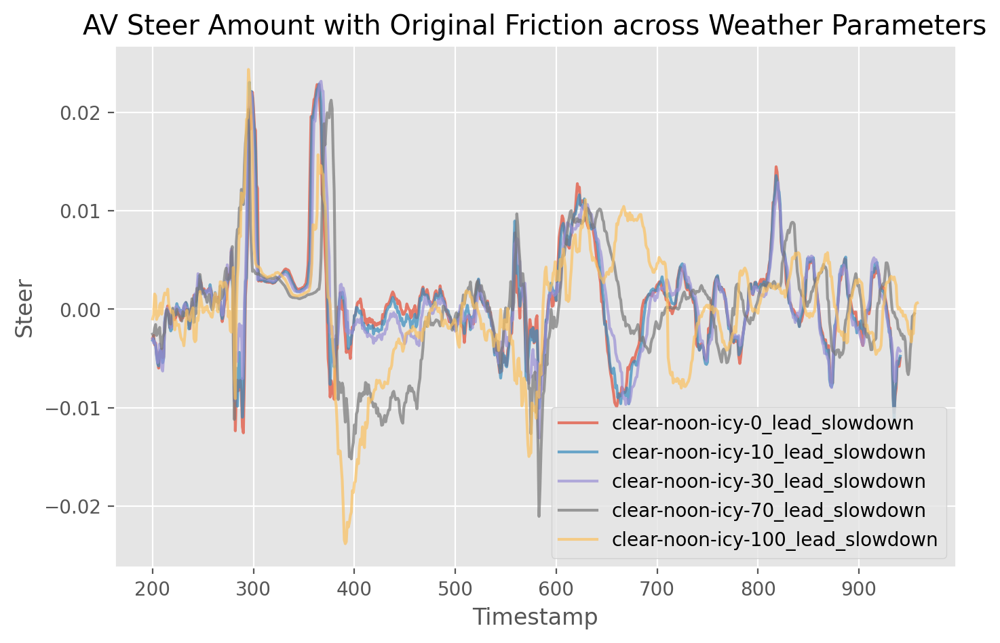

In [46]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_steer = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['steer'].dtypes == 'steer'):
            print(i)
        else:
            if not df_array_orig[weather][i]['steer'].isnull().values.any():
                df_orig_steer["Run"+str(i)] = df_array_orig[weather][i]['steer']

    median_orig_steer = df_orig_steer.median(axis=1)


    plt.plot(median_orig_steer[200:], alpha=0.7)

plt.xlabel("Timestamp")
plt.ylabel("Steer")
plt.title("AV Steer Amount with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

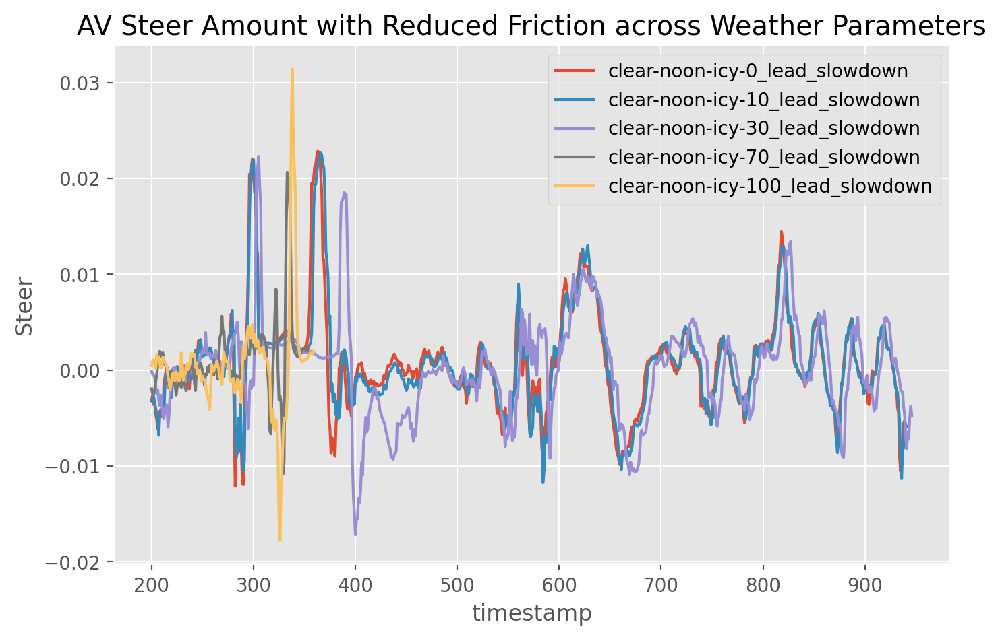

In [47]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_steer = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['steer'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['steer'].isnull().values.any() :
                df_fric_steer["Run"+str(i)] = df_array_fric[weather][i]['steer']

    median_fric_steer = df_fric_steer.median(axis=1)

    plt.plot(median_fric_steer[200:])

    # plt.axis('equal')
plt.xlabel("timestamp")
plt.ylabel("Steer")
plt.title("AV Steer Amount with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

### brake

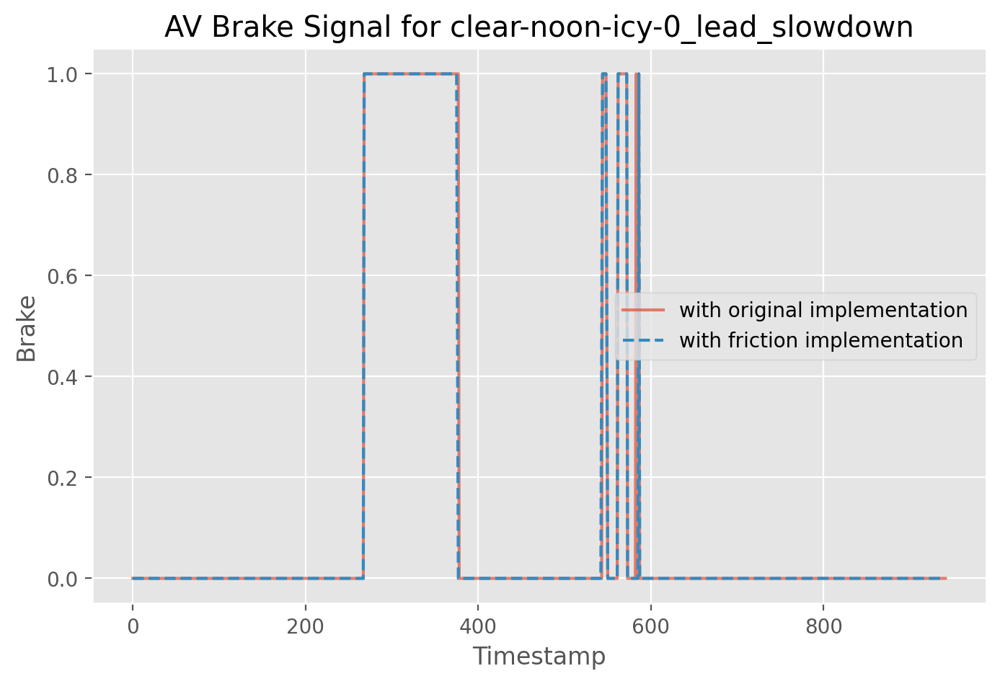

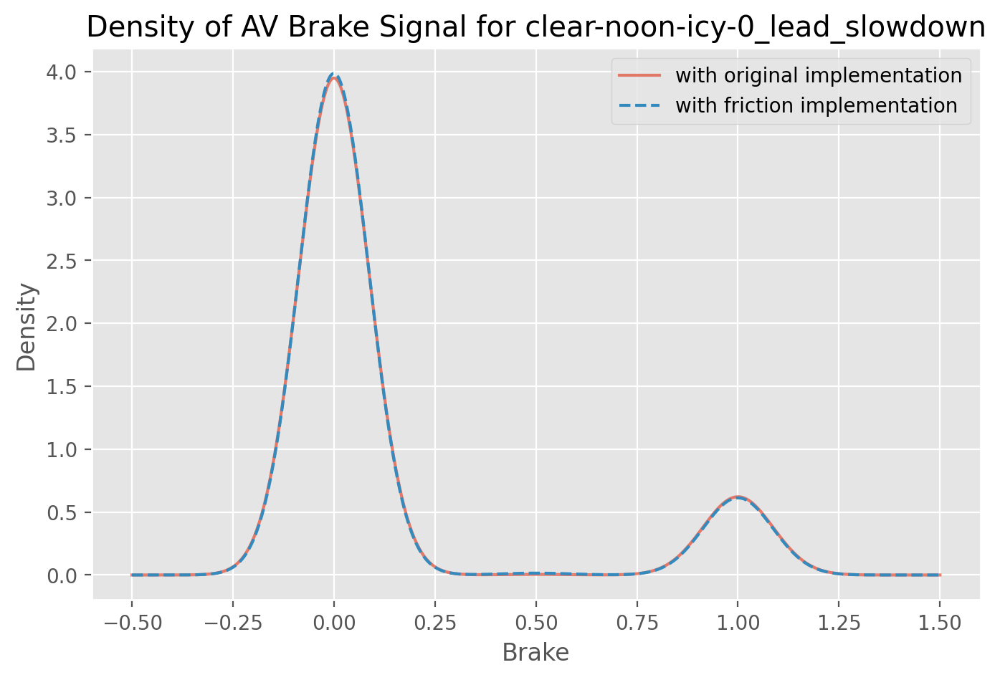

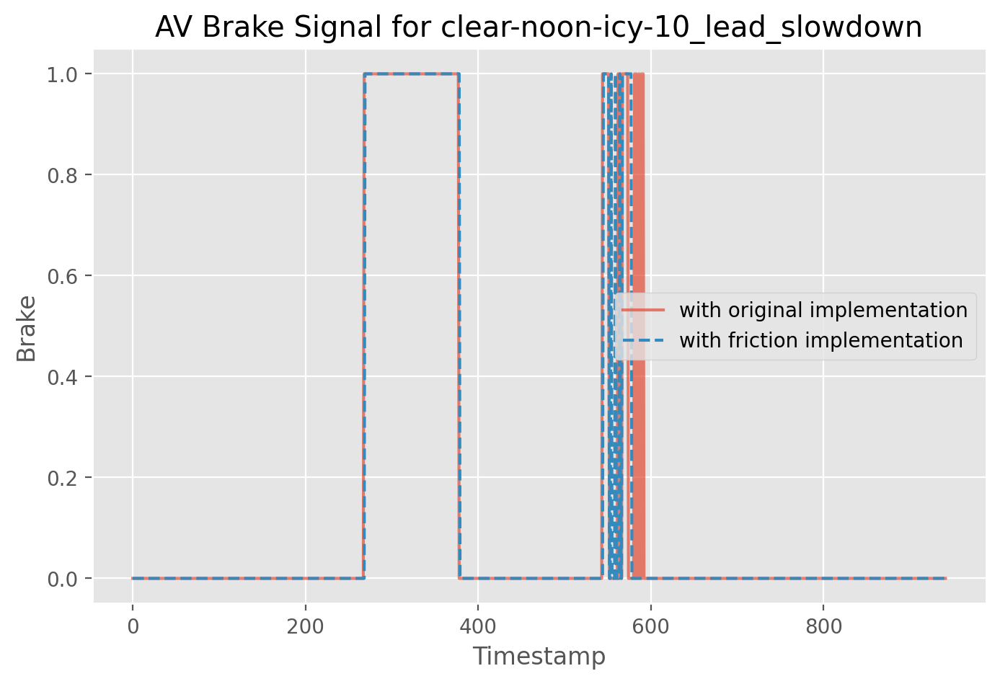

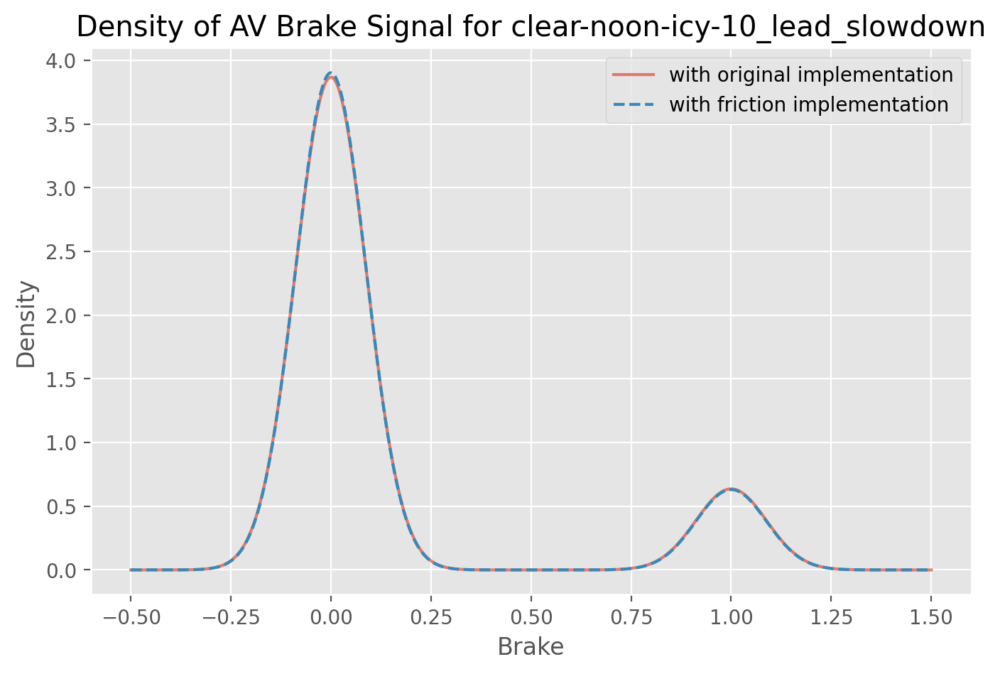

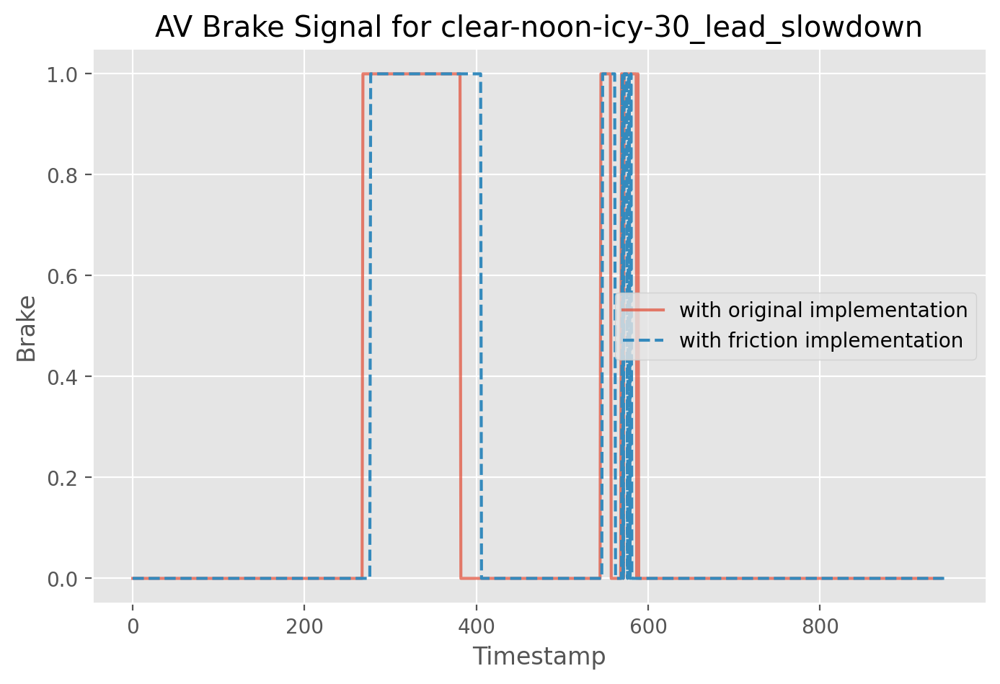

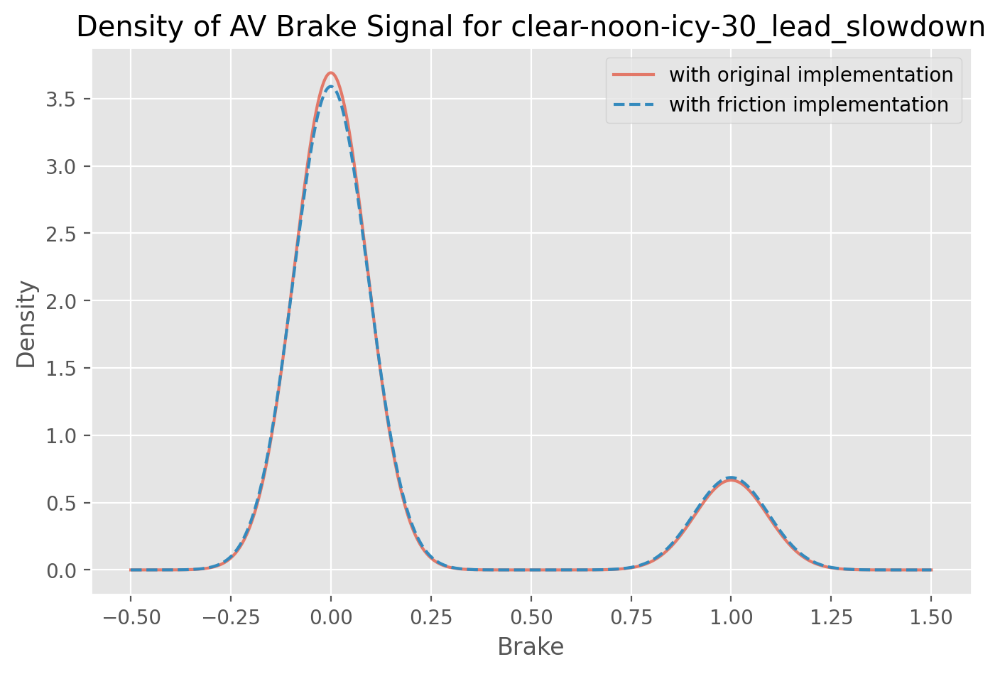

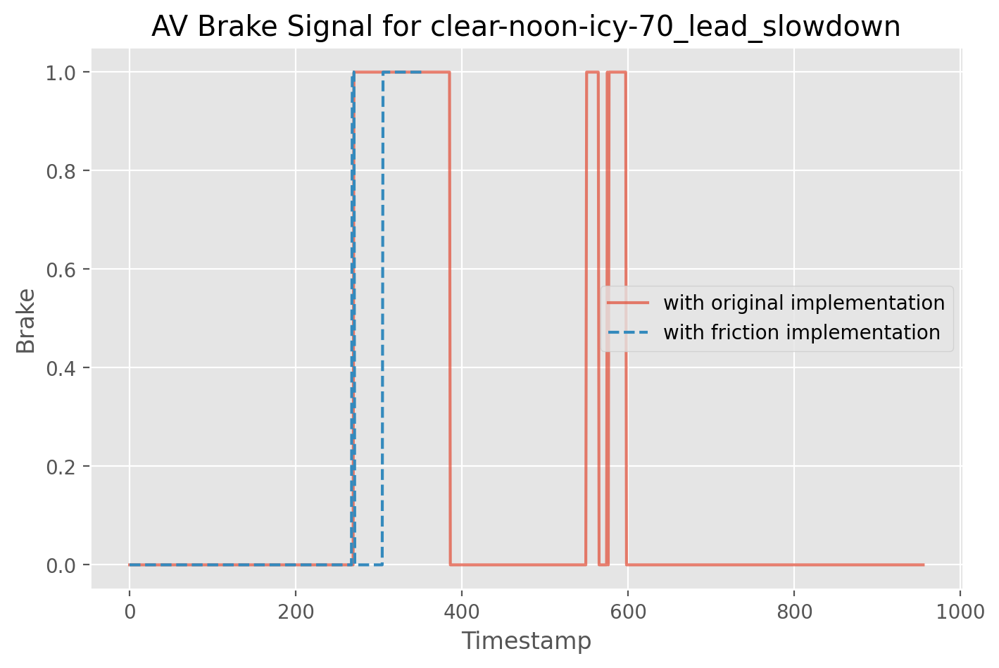

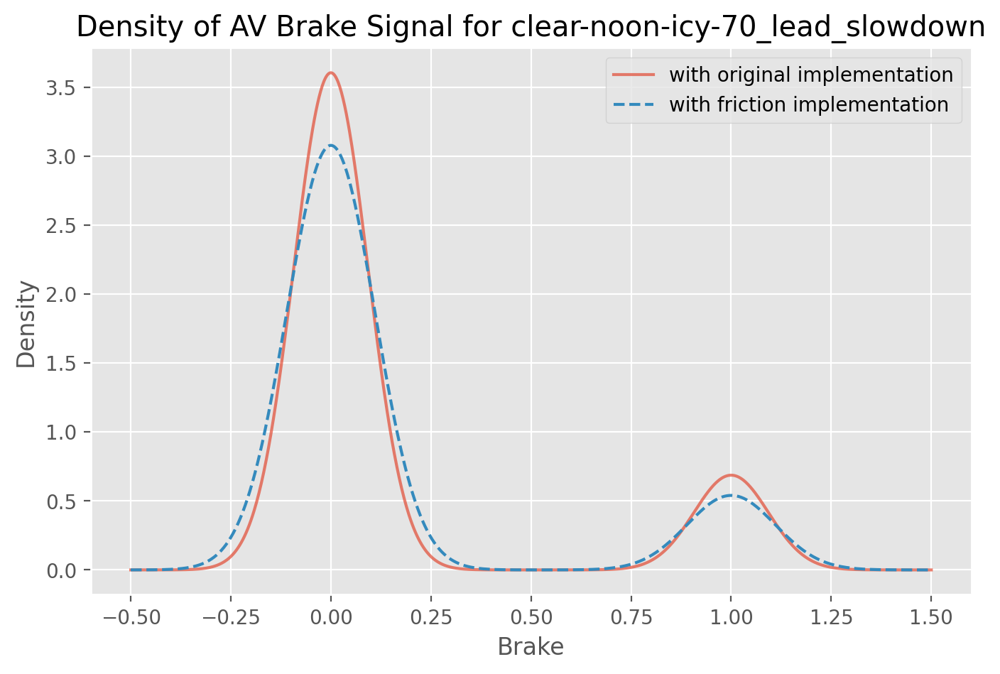

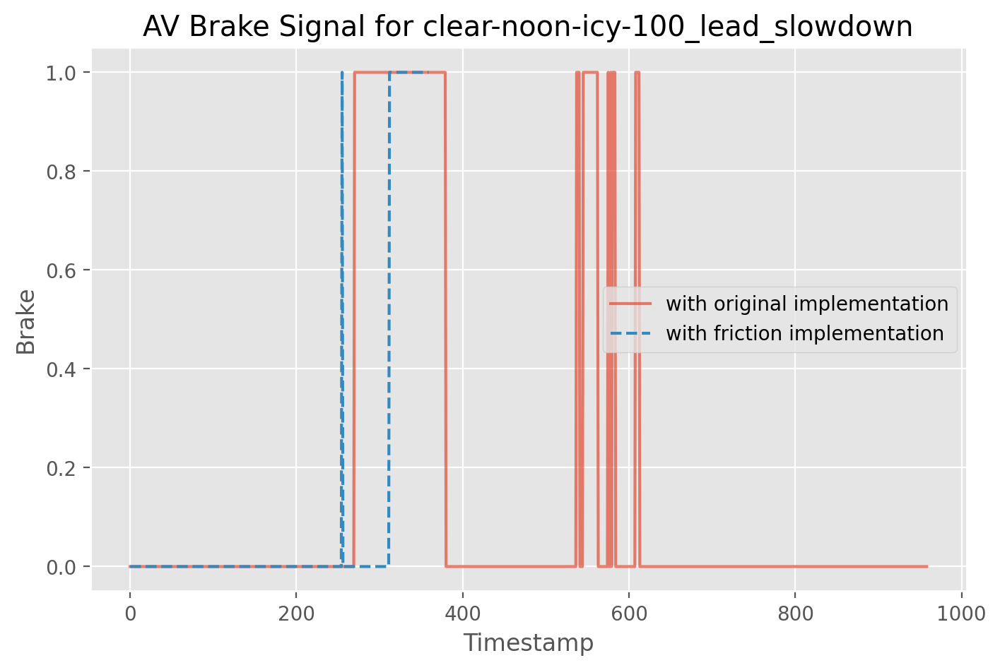

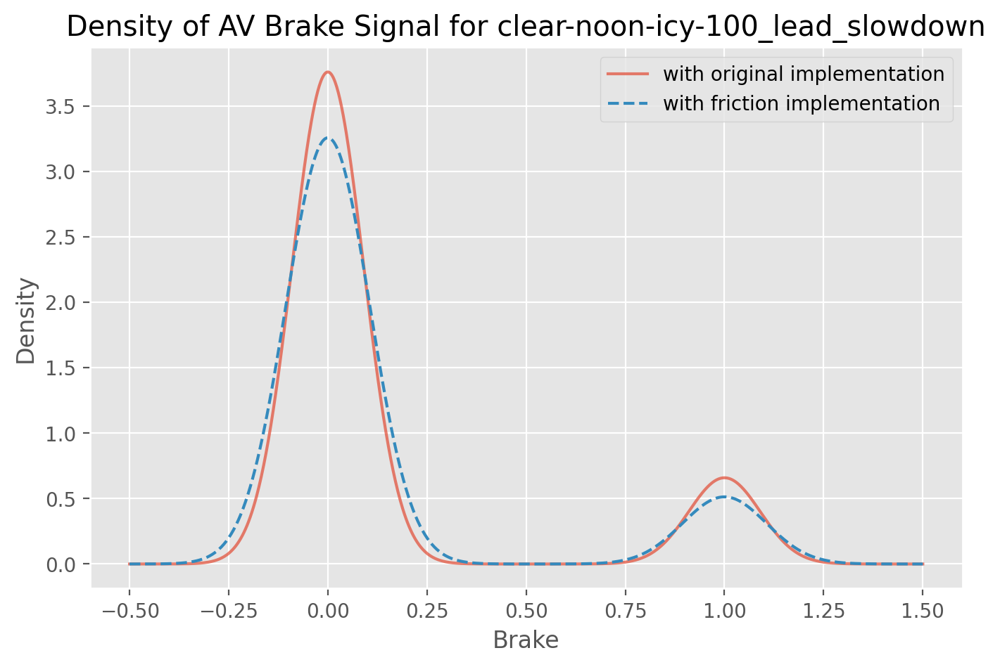

In [48]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)

    plt.plot(median_orig_brake, alpha=0.7)


    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any():
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)
    
    all_medians[weather][5][0] = median_orig_brake
    all_medians[weather][5][1] = median_fric_brake
    
    plt.plot(median_fric_brake, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Brake")
    plt.title("AV Brake Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Brake")
    plt.ylabel("Density")
    median_orig_brake.plot.density(alpha=0.7)
    median_fric_brake.plot.density(style='--')
    plt.title("Density of AV Brake Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()


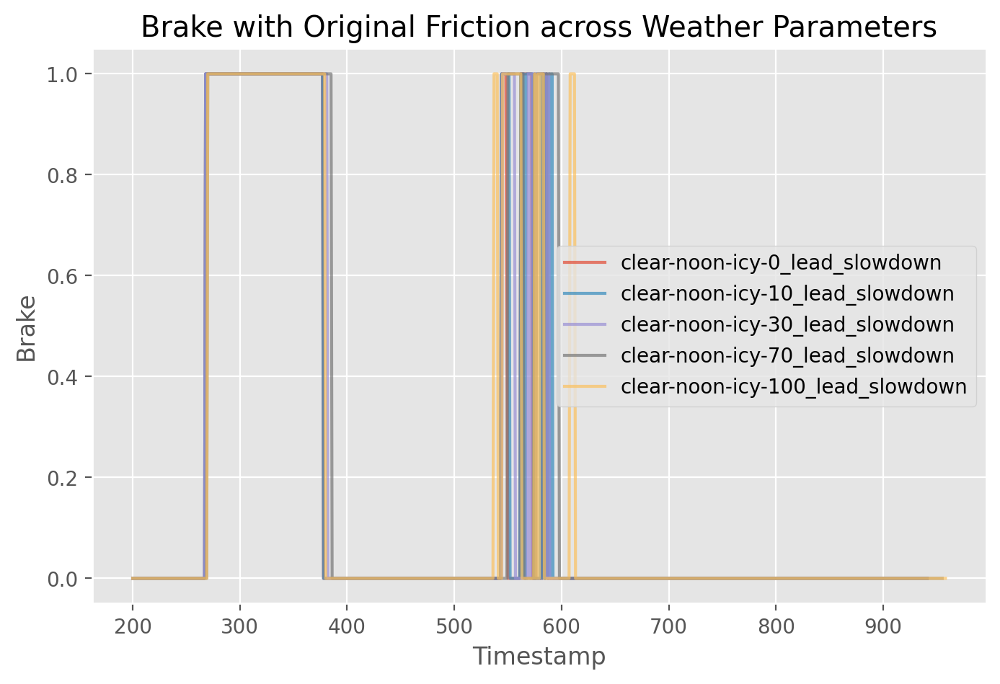

In [49]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_brake = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['brake'].dtypes == 'brake'):
            print(i)
        else:
            if not df_array_orig[weather][i]['brake'].isnull().values.any():
                df_orig_brake["Run"+str(i)] = df_array_orig[weather][i]['brake']

    median_orig_brake = df_orig_brake.median(axis=1)


    plt.plot(median_orig_brake[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Brake")
plt.title("Brake with Original Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

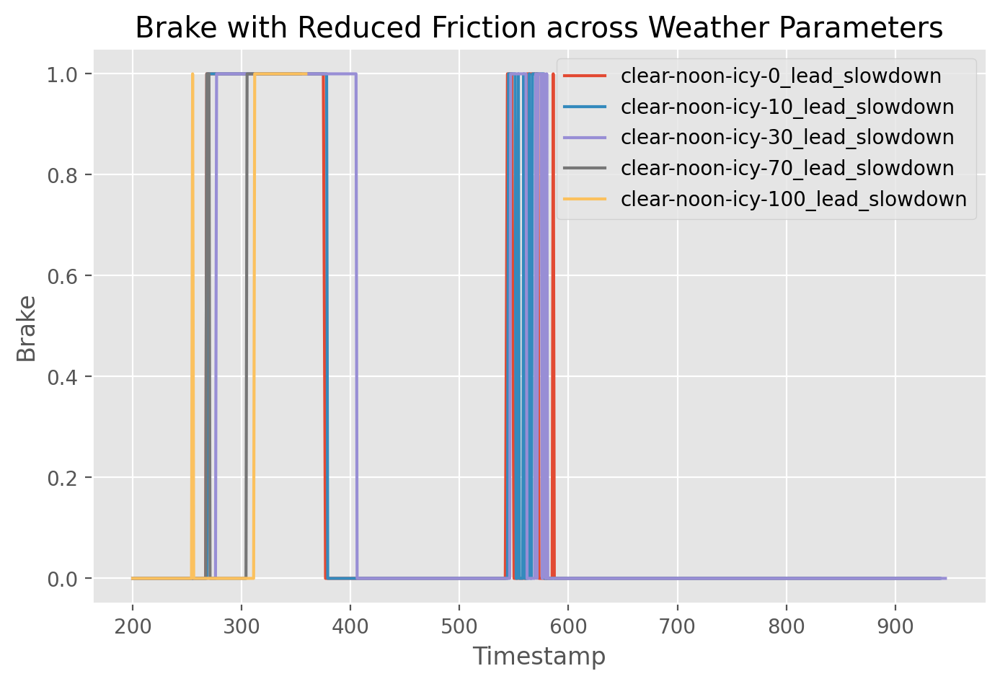

In [50]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):

    df_fric_brake = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['brake'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['brake'].isnull().values.any() :
                df_fric_brake["Run"+str(i)] = df_array_fric[weather][i]['brake']

    median_fric_brake = df_fric_brake.median(axis=1)

    plt.plot(median_fric_brake[200:])

plt.xlabel("Timestamp")
plt.ylabel("Brake")
plt.title("Brake with Reduced Friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

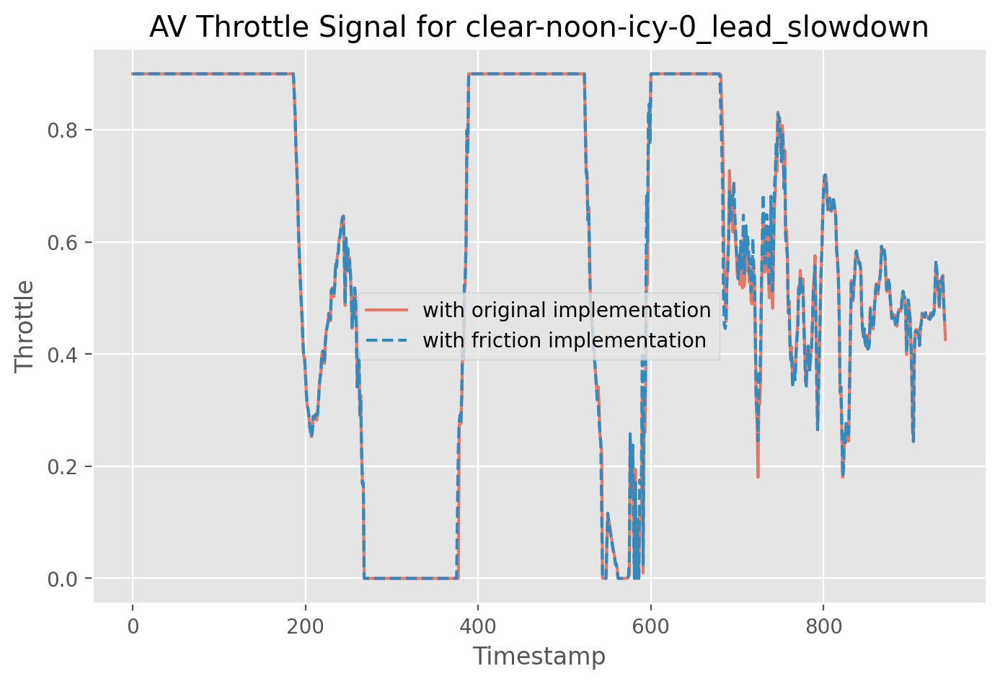

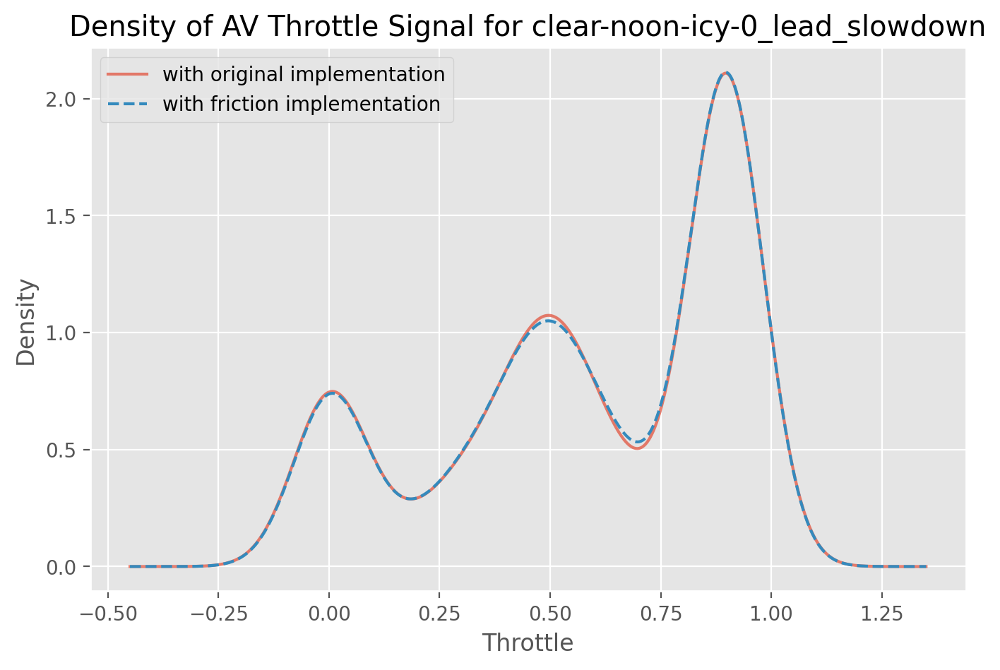

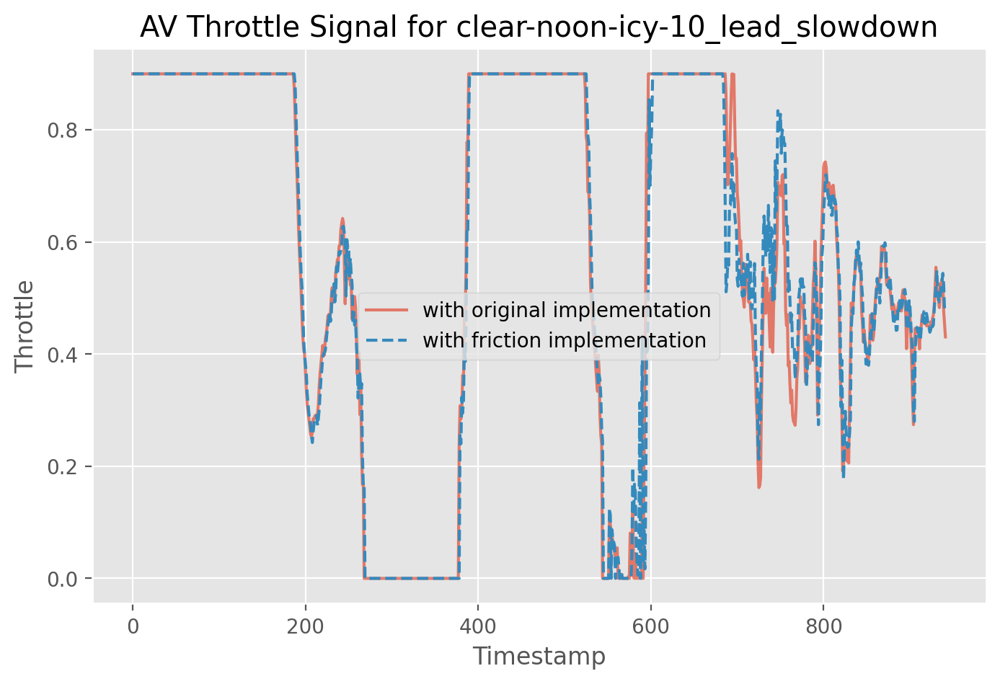

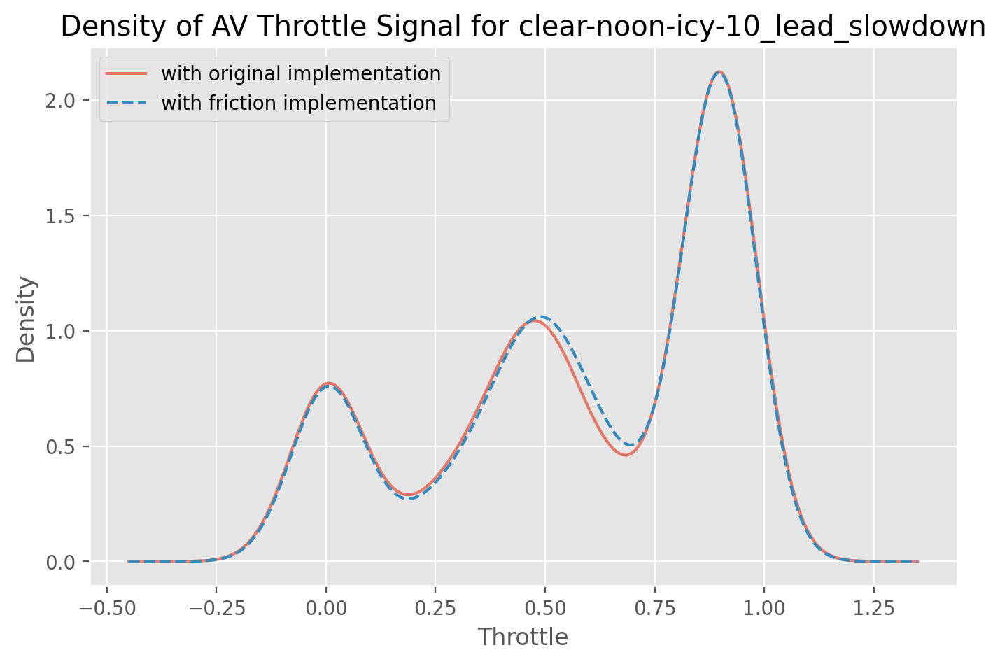

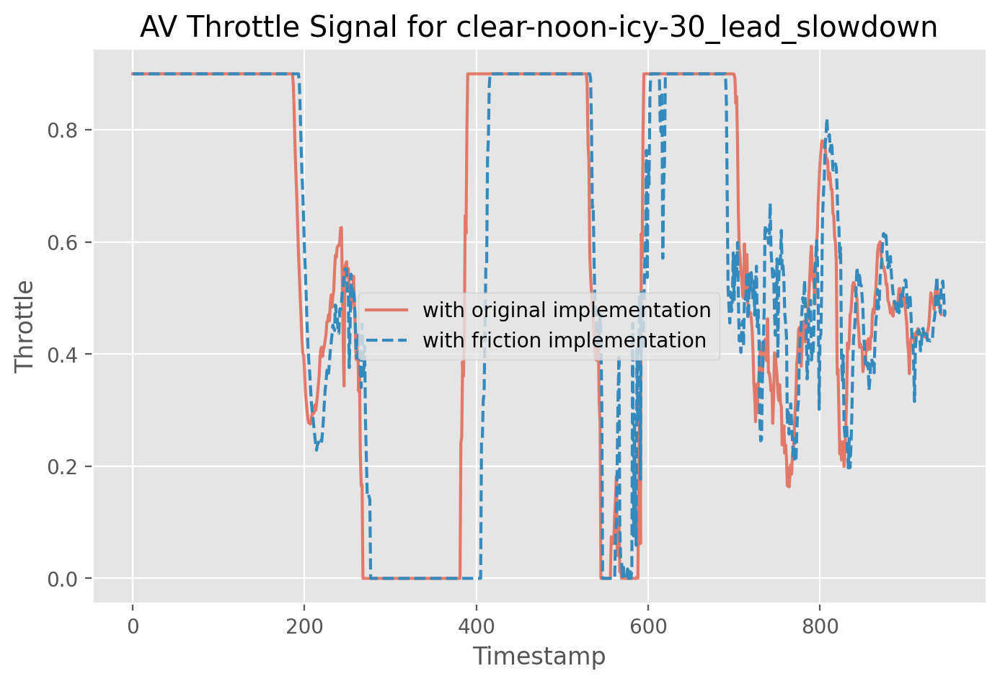

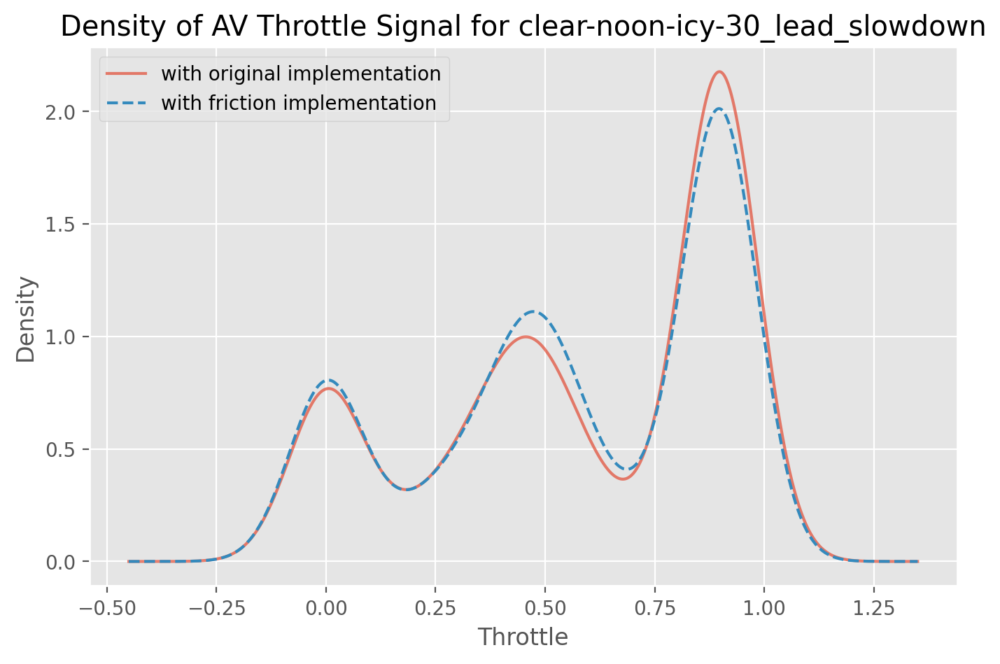

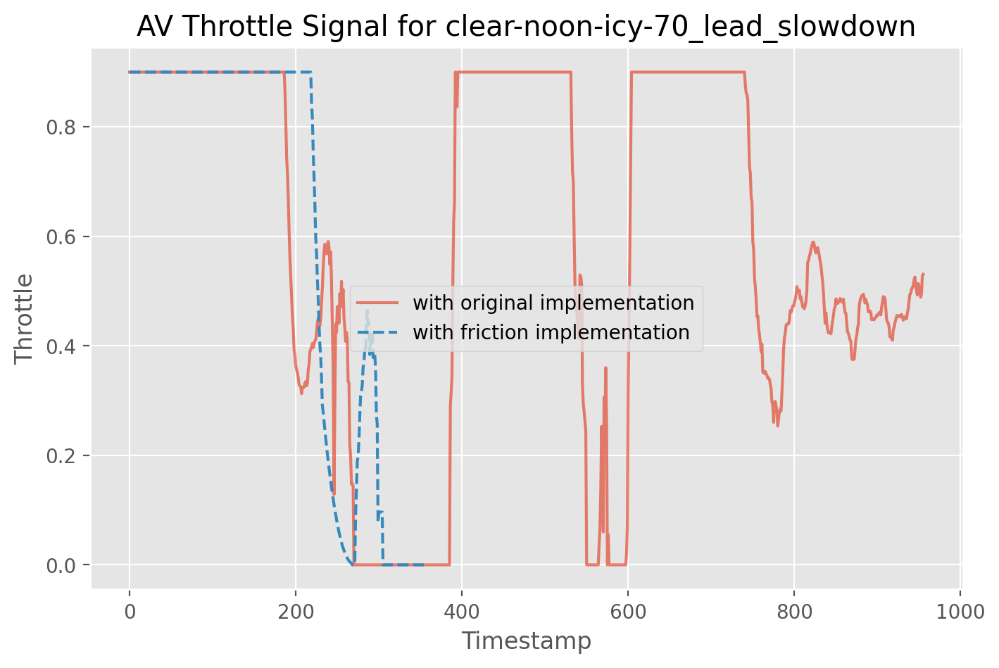

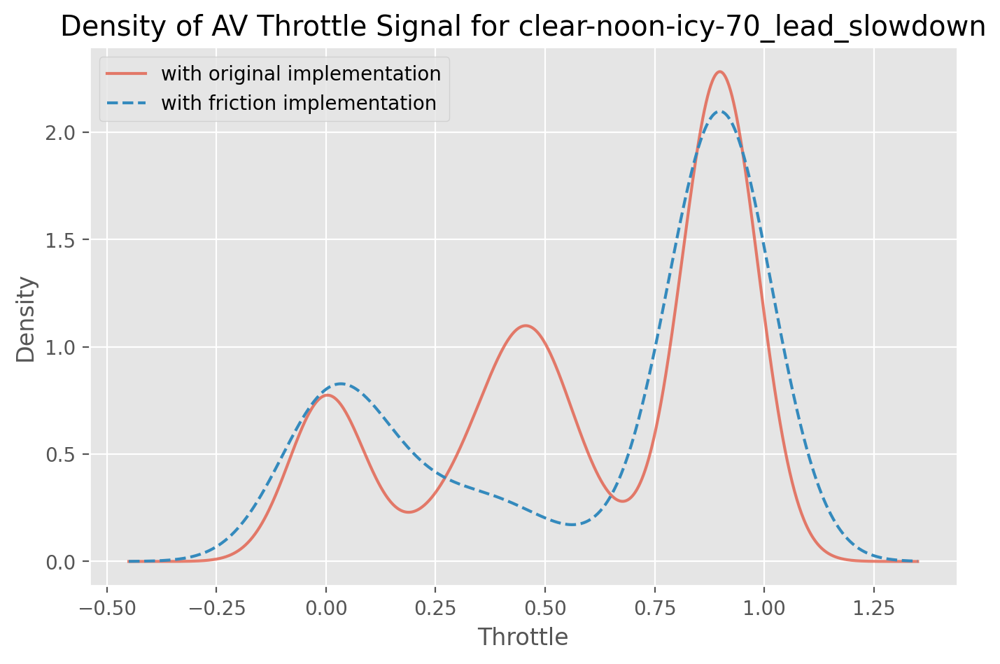

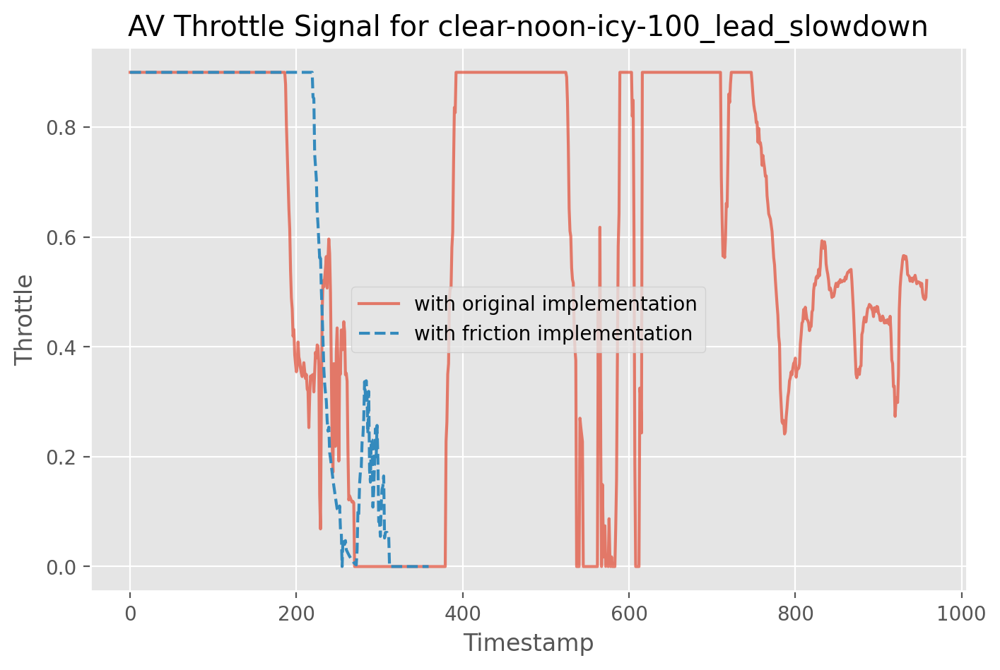

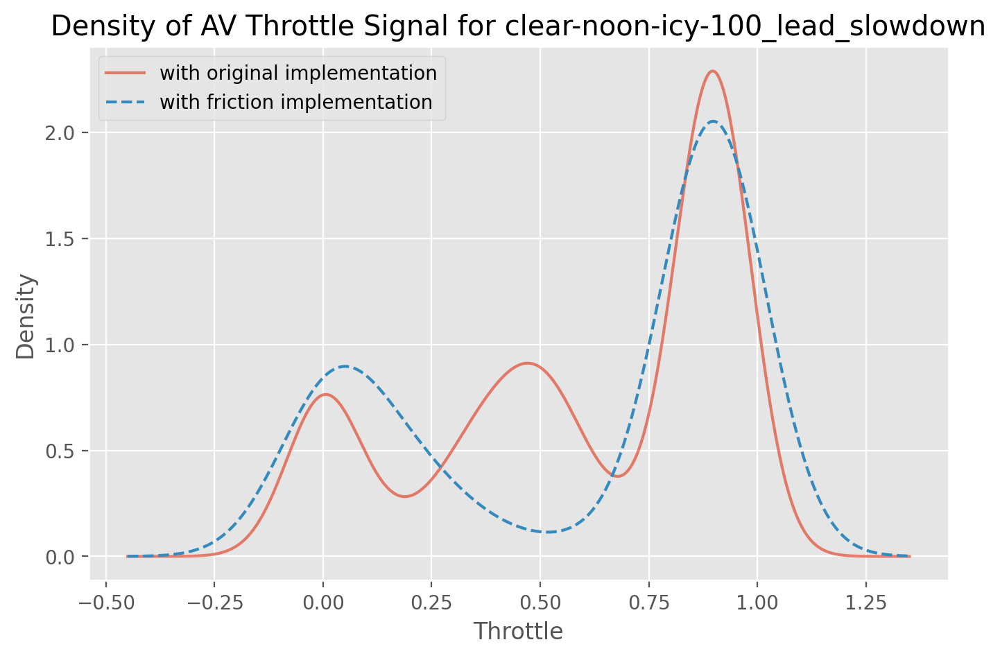

In [51]:
for weather in range(len(txt_lists_fric)):
    plt.figure(figsize=(8,5), dpi=200)
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)

    plt.plot(median_orig_throttle, alpha=0.7)


    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any():
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)
    
    all_medians[weather][6][0] = median_orig_throttle
    all_medians[weather][6][1] = median_fric_throttle
    
    plt.plot(median_fric_throttle, '--')
    
    plt.title(subfolders[weather])
    plt.legend(friction_legend)
    plt.xlabel("Timestamp")
    plt.ylabel("Throttle")
    plt.title("AV Throttle Signal for "+subfolders[weather])
    plt.show()
    
    plt.figure(figsize=(8,5), dpi=200)
    plt.xlabel("Throttle")
    plt.ylabel("Density")
    median_orig_throttle.plot.density(alpha=0.7)
    median_fric_throttle.plot.density(style='--')
    plt.title("Density of AV Throttle Signal for "+subfolders[weather])
    plt.legend(friction_legend)
    plt.show()
    

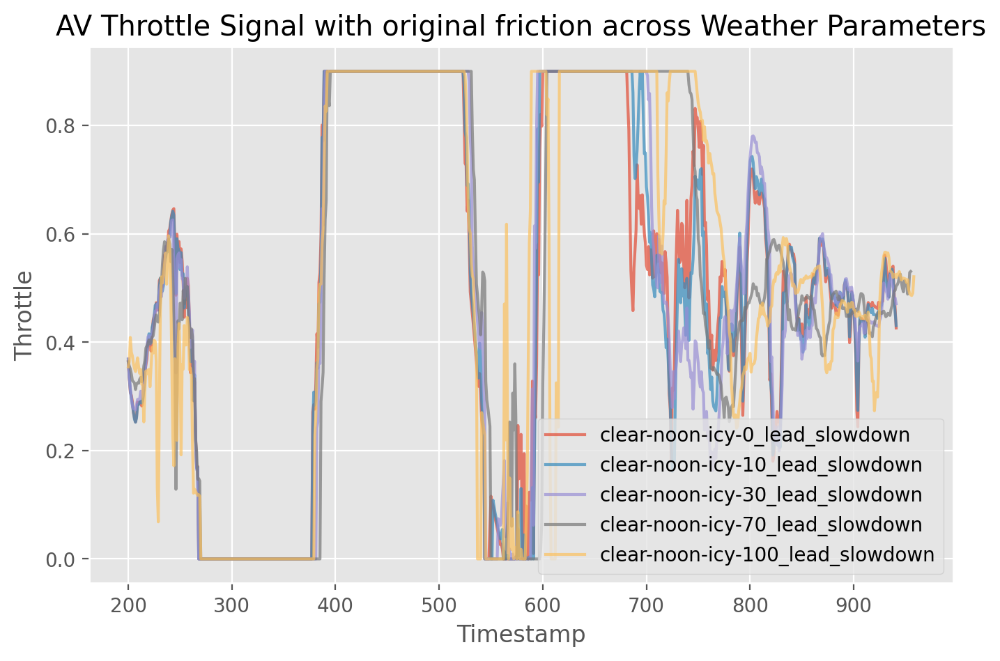

In [52]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_orig_throttle = pd.DataFrame()

    for i in range(0, len(df_array_orig[weather])):
        if(df_array_orig[weather][i]['throttle'].dtypes == 'throttle'):
            print(i)
        else:
            if not df_array_orig[weather][i]['throttle'].isnull().values.any():
                df_orig_throttle["Run"+str(i)] = df_array_orig[weather][i]['throttle']

    median_orig_throttle = df_orig_throttle.median(axis=1)


    plt.plot(median_orig_throttle[200:], alpha=0.7)


plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with original friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

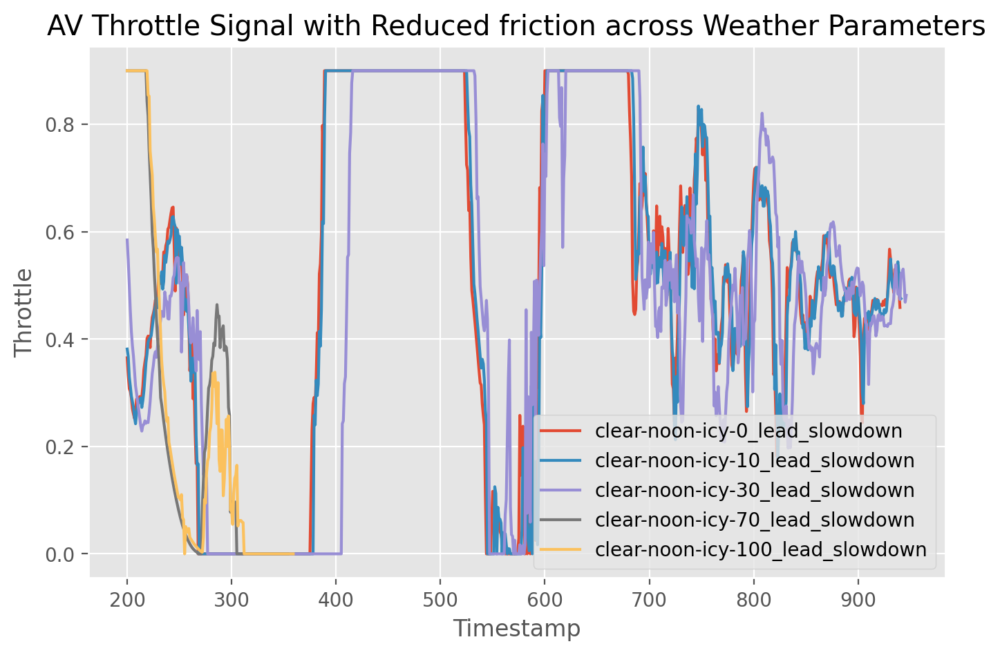

In [53]:
plt.figure(figsize=(8,5), dpi=200)

for weather in range(len(txt_lists_fric)):
    
    df_fric_throttle = pd.DataFrame()

    for i in range(0, len(df_array_fric[weather])):
        if(df_array_fric[weather][i]['throttle'].dtypes == 'object'):
            print(i)
        else:
            if not df_array_fric[weather][i]['throttle'].isnull().values.any() :
                df_fric_throttle["Run"+str(i)] = df_array_fric[weather][i]['throttle']

    median_fric_throttle = df_fric_throttle.median(axis=1)

    plt.plot(median_fric_throttle[200:])

    # plt.axis('equal')
plt.xlabel("Timestamp")
plt.ylabel("Throttle")
plt.title("AV Throttle Signal with Reduced friction across Weather Parameters")
plt.legend(full_legend)
plt.show()

## Dynamic time warping (DTW) for cvip
### measuring similarity between two temporal sequences

In [54]:
all_dtw = [[0] * len(attribute_order)  for i in range(len(txt_lists_fric))]

for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = dtw.distance(all_medians[i][j][0], all_medians[i][j][1])

In [55]:
for i in range(len(txt_lists_fric)):
    for j in range(len(attribute_order)):
        all_dtw[i][j] = round(all_dtw[i][j],2)

In [56]:
df = pd.DataFrame(all_dtw, columns = attribute_order, dtype = float)
df.index = subfolders
df.to_csv("DTW_lead_slowdown_icy.csv")
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_lead_slowdown,0.01,0.76,0.55,0.23,0.00,1.22,0.38
clear-noon-icy-10_lead_slowdown,0.02,1.11,1.66,0.84,0.02,2.00,0.80
clear-noon-icy-30_lead_slowdown,0.04,1.82,4.06,9.21,0.04,1.00,1.10
clear-noon-icy-70_lead_slowdown,9.58,984.81,80.28,185.55,0.10,9.33,8.73
clear-noon-icy-100_lead_slowdown,10.19,967.95,77.93,199.31,0.10,9.00,9.99


## KS Test for cvip

In [57]:
import scipy as sp

In [58]:
all_ks = np.empty((len(txt_lists_fric), len(attribute_order), 2))
# [[0] * len(attribute_order)  for i in range(len(txt_lists_fric)-1)]
for i in range(len(txt_lists_fric)-1):
    for j in range(len(attribute_order)):
        ks_test = sp.stats.ks_2samp(all_medians[i][j][0], all_medians[i][j][1])
        all_ks[i][j][0] = ks_test.pvalue
        all_ks[i][j][1] = ks_test.statistic

C:\Users\kilob\AppData\Local\Temp\ipykernel_27048\3582443724.py:5: RuntimeWarning: ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  ks_test = sp.stats.ks_2samp(all_medians[i][j][0], all_medians[i][j][1])


In [59]:
df = pd.DataFrame(all_ks[:,:,0], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_lead_slowdown,3.288852e-03,4.806571e-02,8.270201e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
clear-noon-icy-10_lead_slowdown,3.903683e-05,4.331277e-03,3.343104e-01,6.877632e-01,9.999463e-01,1.000000e+00,6.877632e-01
clear-noon-icy-30_lead_slowdown,1.131250e-06,1.429714e-07,7.351510e-02,2.186906e-09,1.140997e-01,1.000000e+00,2.897988e-01
clear-noon-icy-70_lead_slowdown,2.127479e-77,4.660434e-80,1.278422e-03,2.292828e-48,1.637562e-07,1.000000e+00,1.694045e-04
clear-noon-icy-100_lead_slowdown,1.047211e-311,1.047211e-311,1.047211e-311,1.047211e-311,1.047211e-311,1.047211e-311,1.047211e-311


In [60]:
df = pd.DataFrame(all_ks[:,:,1], columns = attribute_order, dtype = float)
df.index = subfolders
df

,x,y,v,cvip,steer,brake,throttle
clear-noon-icy-0_lead_slowdown,8.218320e-02,6.226605e-02,2.833752e-02,1.099251e-02,1.109404e-02,3.043697e-03,1.117188e-02
clear-noon-icy-10_lead_slowdown,1.072187e-01,8.067941e-02,4.352442e-02,3.290870e-02,1.486200e-02,2.123142e-03,3.290870e-02
clear-noon-icy-30_lead_slowdown,1.227791e-01,1.313221e-01,5.862518e-02,1.470584e-01,5.455153e-02,7.640622e-03,4.467679e-02
clear-noon-icy-70_lead_slowdown,5.659467e-01,5.749661e-01,1.183099e-01,4.522070e-01,1.763392e-01,1.074607e-02,1.336378e-01
clear-noon-icy-100_lead_slowdown,1.047211e-311,1.047211e-311,1.047211e-311,1.047211e-311,1.047211e-311,1.047211e-311,1.047211e-311


You reject the null hypothesis that the two samples were drawn from the same distribution if the p-value is less than your significance level.
**pvalue=4.2177381979173086e-06**